In [1]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
#plt.style.use('ggplot')


from itertools import cycle
import networkx as nx



from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC

from matplotlib_venn import venn2
from matplotlib_venn import venn3
import venn
from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
#sample_list = []
#vcf_files = []
#directory = "in_silico"

#for file in os.listdir(directory):
#    if file.endswith(".snp.hf.pass.vcf"):
#        name = file.split(".")[0]
#        sample_list.append(name)
#        file_path = os.path.join(directory, file)
#        vcf_files.append(file_path)
        
#sample_list.sort()
#vcf_files.sort()

#print(sample_list)
#print(vcf_files)

In [4]:
sample_list = []
vcf_files = []
directory = "samples/in_silico"

for file in os.listdir(directory):
    if file.endswith(".tab"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['16250874FFD', '56850173', 'AL-75607', 'AL14621', 'BURGOS89109', 'P1_50', 'P1_80', 'P1_90', 'P1_95', 'P2_50', 'P2_80', 'P2_90', 'P2_95', 'P3_50', 'P3_80', 'P3_90', 'P3_95', 'SOMOZACOL2']
['samples/in_silico/16250874FFD.snp.hf.pass.raw.tab', 'samples/in_silico/56850173.snp.hf.pass.raw.tab', 'samples/in_silico/AL-75607.snp.hf.pass.raw.tab', 'samples/in_silico/AL14621.snp.hf.pass.raw.tab', 'samples/in_silico/BURGOS89109.snp.hf.pass.raw.tab', 'samples/in_silico/P1_50.snp.hf.pass.raw.tab', 'samples/in_silico/P1_80.snp.hf.pass.raw.tab', 'samples/in_silico/P1_90.snp.hf.pass.raw.tab', 'samples/in_silico/P1_95.snp.hf.pass.raw.tab', 'samples/in_silico/P2_50.snp.hf.pass.raw.tab', 'samples/in_silico/P2_80.snp.hf.pass.raw.tab', 'samples/in_silico/P2_90.snp.hf.pass.raw.tab', 'samples/in_silico/P2_95.snp.hf.pass.raw.tab', 'samples/in_silico/P3_50.snp.hf.pass.raw.tab', 'samples/in_silico/P3_80.snp.hf.pass.raw.tab', 'samples/in_silico/P3_90.snp.hf.pass.raw.tab', 'samples/in_silico/P3_95.snp.hf.pass.ra

# Import vcf as dataframe

In [5]:
#x = datetime.datetime.now()
#print(x)
#dict_vcf = {}
#for vcf, df_name in zip(vcf_files, sample_list):
#    dict_vcf[df_name] = import_VCF42_to_pandas(vcf)
#y = datetime.datetime.now()
#print(y)
#print("Done with import in: %s" % (y - x))

In [6]:
dict_vcf = {}
for vcf_file, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = pd.read_csv(vcf_file, sep="\t", header=0)

In [7]:
dict_vcf['P1_80'].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
0,MTB_anc,1977,.,G,A,21377.81,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.720;DP=42;Ex...,GT:AD:DP:GQ:PL,"0/1:10,32:42:99:1042,0,200",1.0,0.5,2.0,0.72,42.0,0.0000,2.265,0.7998,60.0,0.0,30.72,0.655,0.490,0/1,"10,32",99.0,"1042,0,200",NaN,NaN,NaN,2,10.0,32.0,0,1,42.0,0.238095,0.761905,False,1977.0,555.0,1
1,MTB_anc,2532,.,C,T,115503.10,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.67;DP=13;Exce...,GT:AD:DP:GQ:PL,"1/1:0,13:13:39:394,39,0",2.0,1.0,2.0,1.67,13.0,3.0103,0.000,-0.0013,60.0,0.0,33.20,1.260,0.037,1/1,"0,13",39.0,"394,39,0",NaN,NaN,NaN,2,0.0,13.0,1,1,13.0,0.000000,1.000000,False,555.0,3608.0,1
2,MTB_anc,6140,.,G,T,22254.13,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.43;DP=52;Exc...,GT:AD:DP:GQ:PL,"0/1:43,9:52:99:213,0,1214",1.0,0.5,2.0,1.43,52.0,0.0000,0.919,0.8374,60.0,0.0,29.48,-0.273,0.827,0/1,"43,9",99.0,"213,0,1214",NaN,NaN,NaN,2,43.0,9.0,0,1,52.0,0.826923,0.173077,False,3608.0,1445.0,1
3,MTB_anc,7585,.,C,G,34897.47,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.27;DP=72;Exc...,GT:AD:DP:GQ:PL,"0/1:22,50:72:99:1565,0,484",1.0,0.5,2.0,1.27,72.0,0.0000,0.000,0.8559,60.0,0.0,32.58,-0.405,0.565,0/1,"22,50",99.0,"1565,0,484",NaN,NaN,NaN,2,22.0,50.0,0,1,72.0,0.305556,0.694444,False,1445.0,1558.0,1
4,MTB_anc,9143,.,C,T,332614.84,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.80;DP=73;Exce...,GT:AD:DP:GQ:PL,"1/1:0,73:73:99:2536,218,0",2.0,1.0,2.0,1.80,73.0,3.0103,0.000,-0.0000,60.0,0.0,33.99,0.467,0.988,1/1,"0,73",99.0,"2536,218,0",NaN,NaN,NaN,2,0.0,73.0,1,1,73.0,0.000000,1.000000,False,1558.0,161.0,1


In [8]:
dict_vcf['P1_80'].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [9]:
dict_dff = {}
distance = 2
QD = 15
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= 2)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [10]:
dict_dff['P1_80'][dict_dff['P1_80'].Is_repeat == True].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


In [11]:
dict_dff['P1_80'][dict_dff['P1_80'].snp_left_distance <= 30].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
219,MTB_anc,498557,.,A,C,27989.37,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.60;DP=62;Exc...,GT:AD:DP:GQ:PL,"0/1:10,52:62:99:1763,0,157",1.0,0.5,2.0,1.60,62.0,0.0000,2.845,0.9075,60.0,0.0,33.60,-1.763,0.379,0/1,"10,52",99.0,"1763,0,157",NaN,NaN,NaN,2,10.0,52.0,0,1,62.0,0.161290,0.838710,False,26.0,396.0,1
288,MTB_anc,709226,.,G,A,111116.83,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.07;DP=53;Exc...,GT:AD:DP:GQ:PGT:PID:PL:PS,"0|1:41,12:53:99:0|1:709206_C_T:381,0,2439:709206",1.0,0.5,2.0,3.07,53.0,-0.0000,0.000,0.9482,60.0,0.0,34.98,2.220,0.754,0|1,"41,12",99.0,"381,0,2439",0|1,709206_C_T,709206.0,2,41.0,12.0,0,1,53.0,0.773585,0.226415,False,19.0,3467.0,1
320,MTB_anc,815851,.,G,A,266818.70,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.76;DP=81;Exce...,GT:AD:DP:GQ:PL,"1/1:0,81:81:99:2410,240,0",2.0,1.0,2.0,1.76,81.0,3.0103,0.000,-0.0000,60.0,0.0,33.57,0.239,0.459,1/1,"0,81",99.0,"2410,240,0",NaN,NaN,NaN,2,0.0,81.0,1,1,81.0,0.000000,1.000000,False,16.0,1779.0,1
424,MTB_anc,1107940,.,C,A,196119.93,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.58;DP=70;Exce...,GT:AD:DP:GQ:PL,"1/1:0,70:70:99:2220,209,0",2.0,1.0,2.0,1.58,70.0,-0.0000,0.000,1.0000,60.0,0.0,33.95,1.400,0.088,1/1,"0,70",99.0,"2220,209,0",NaN,NaN,NaN,2,0.0,70.0,1,1,70.0,0.000000,1.000000,False,23.0,1223.0,1
474,MTB_anc,1250357,.,G,T,288542.83,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.78;DP=83;Exce...,GT:AD:DP:GQ:PL,"1/1:0,83:83:99:2844,249,0",2.0,1.0,2.0,1.78,83.0,3.0103,0.000,-0.0000,60.0,0.0,33.76,0.730,0.409,1/1,"0,83",99.0,"2844,249,0",NaN,NaN,NaN,2,0.0,83.0,1,1,83.0,0.000000,1.000000,False,17.0,754.0,1


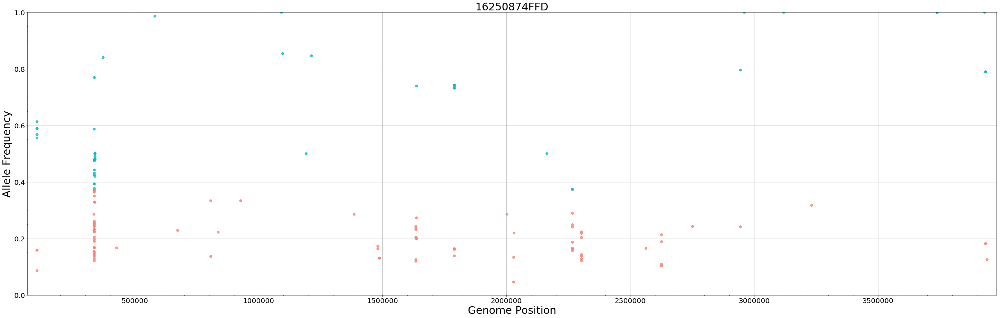

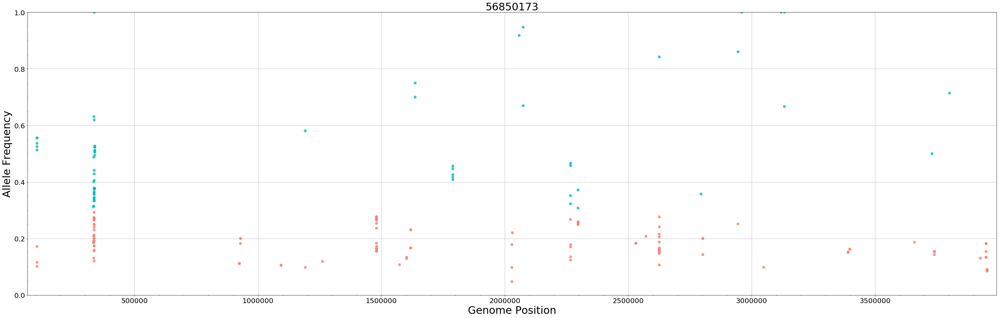

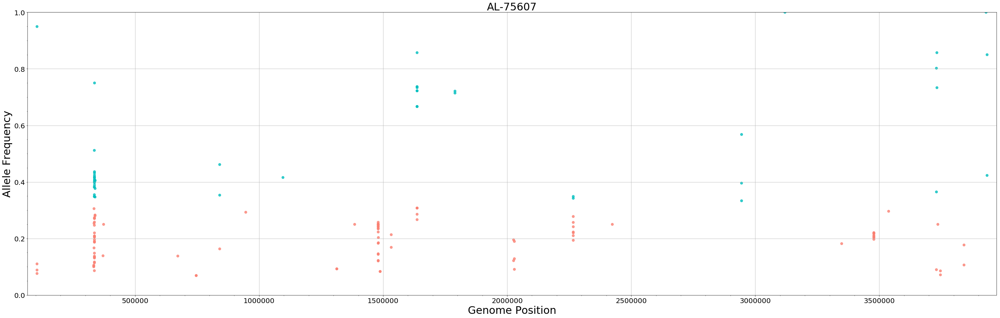

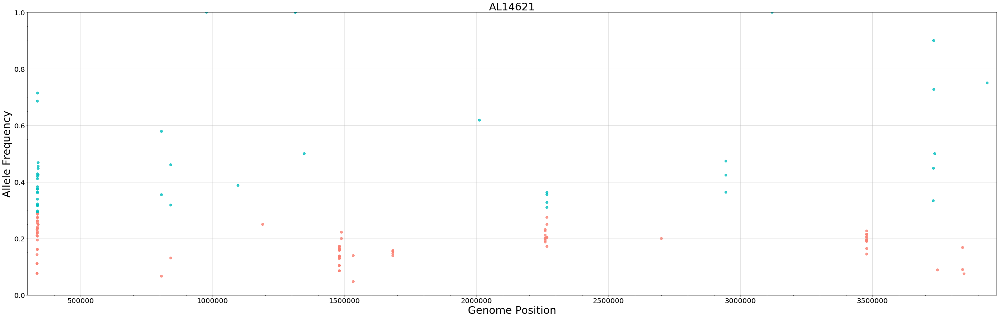

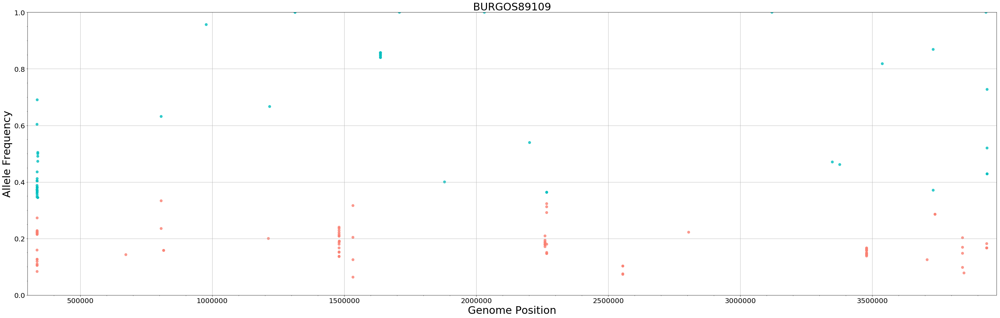

...

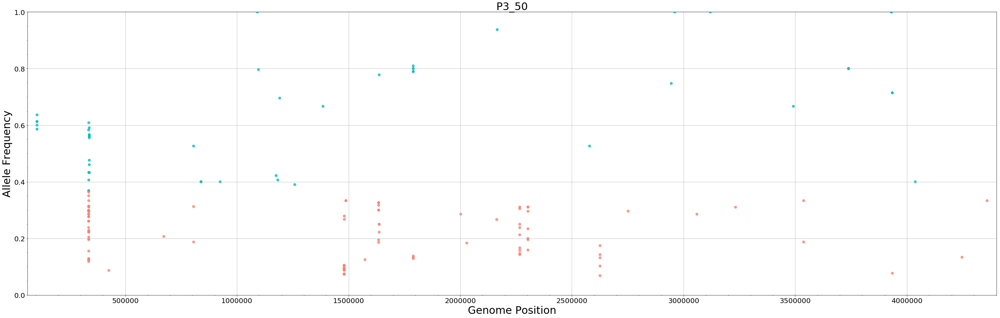

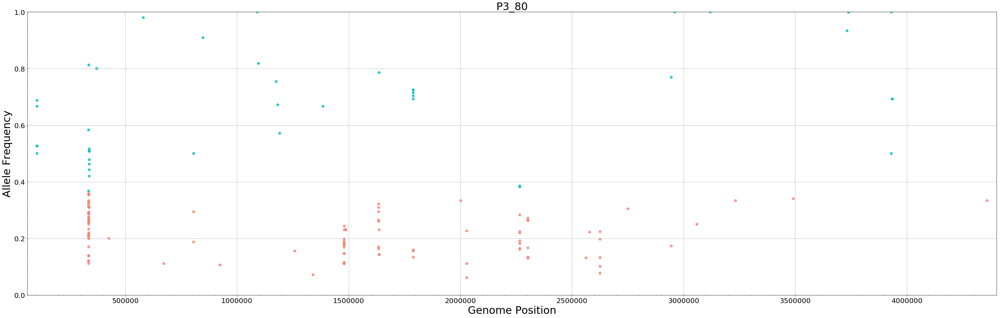

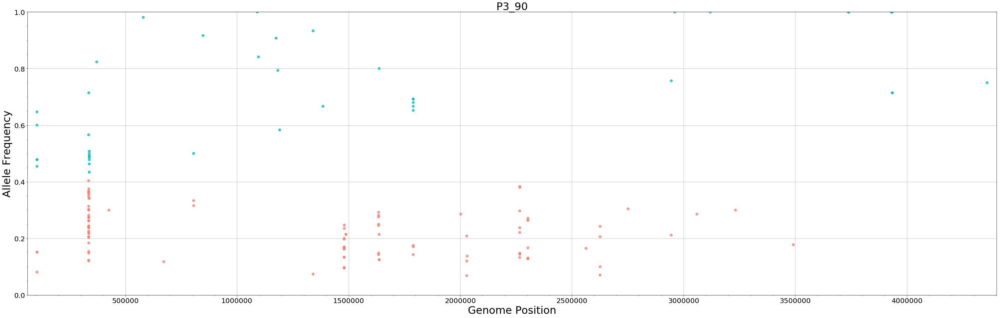

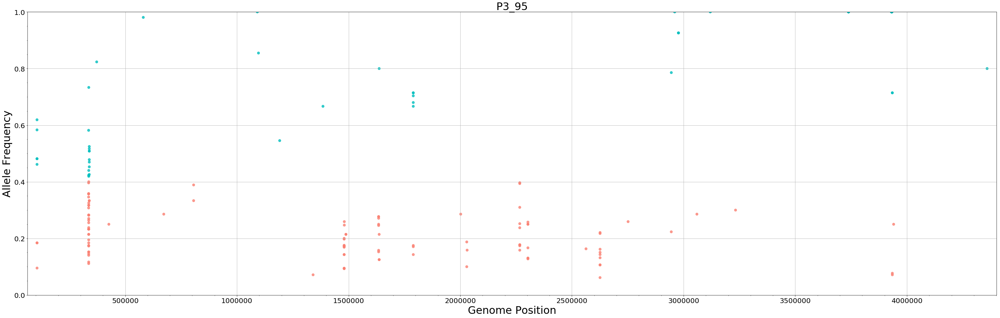

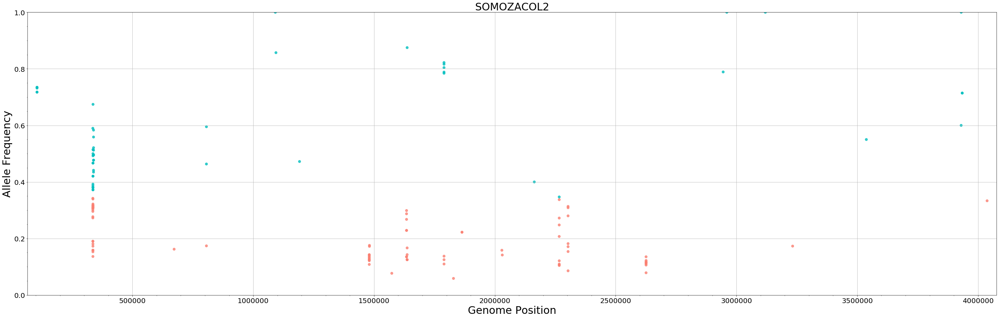

In [12]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

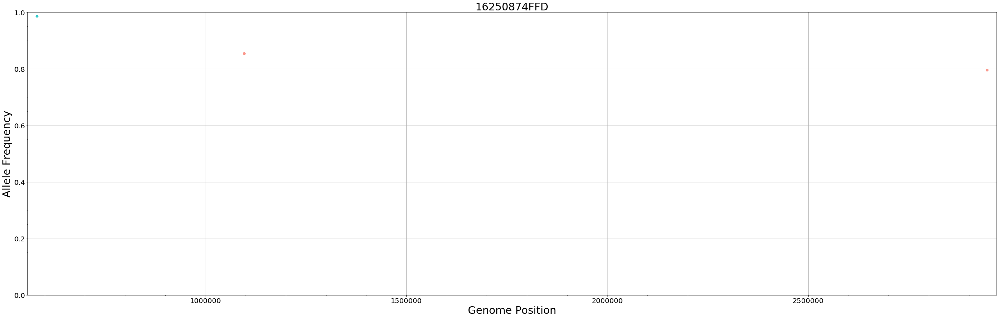

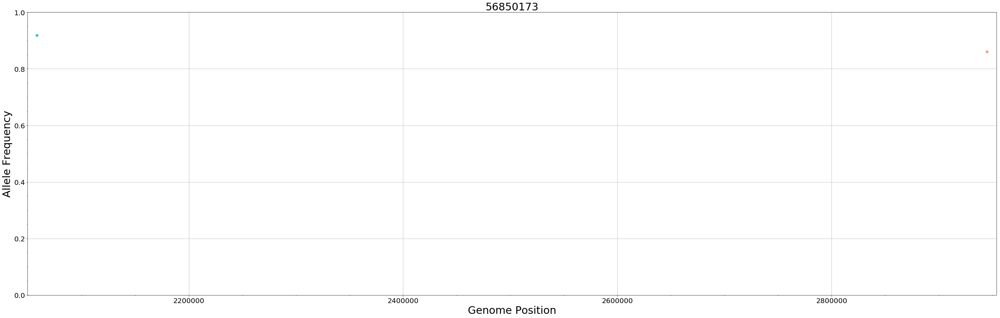

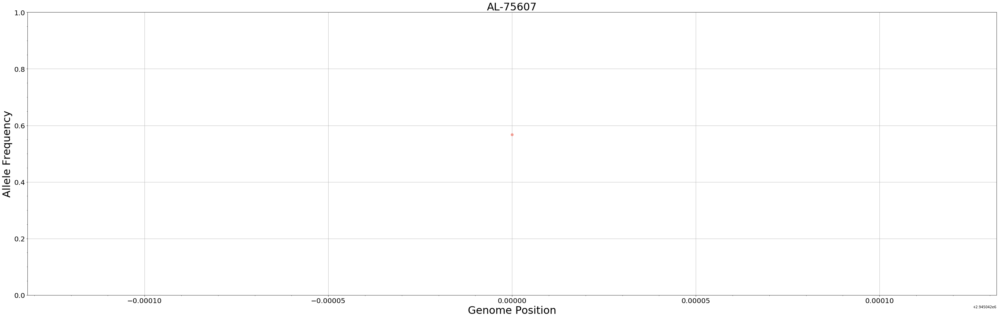

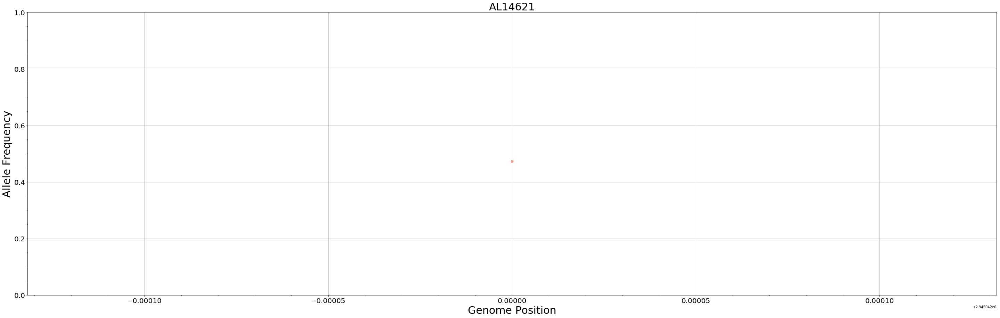

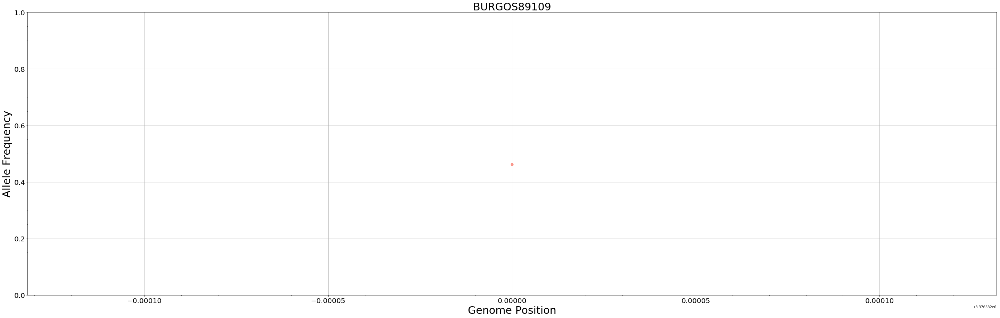

...

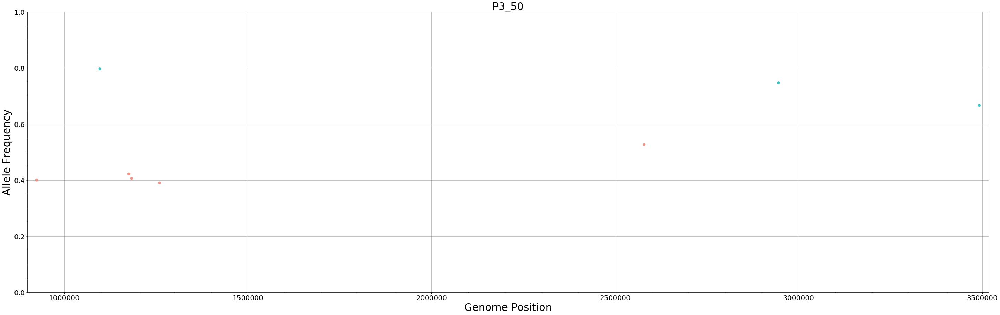

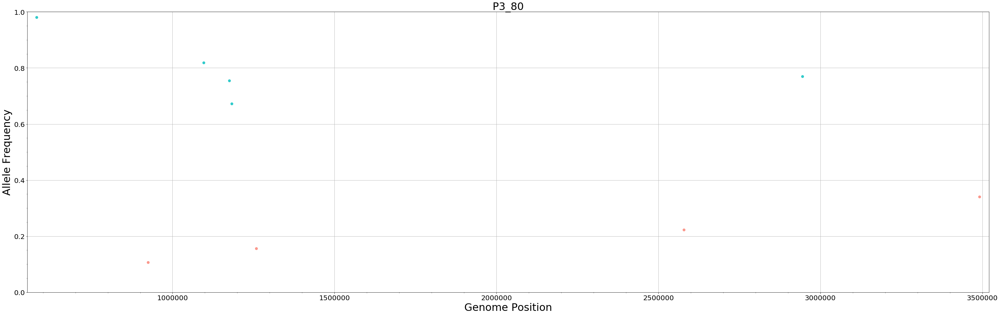

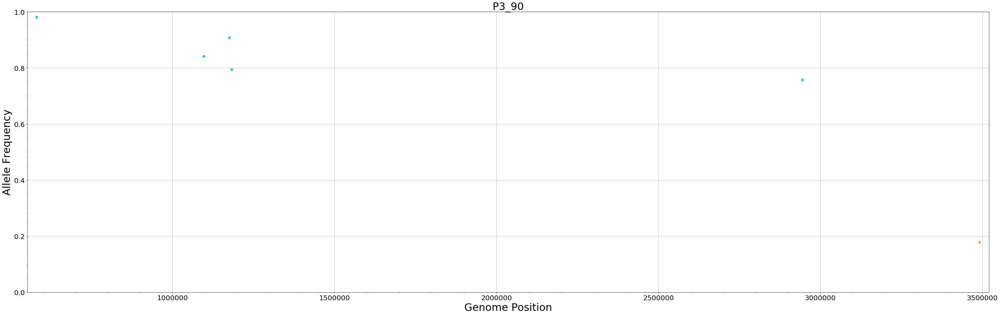

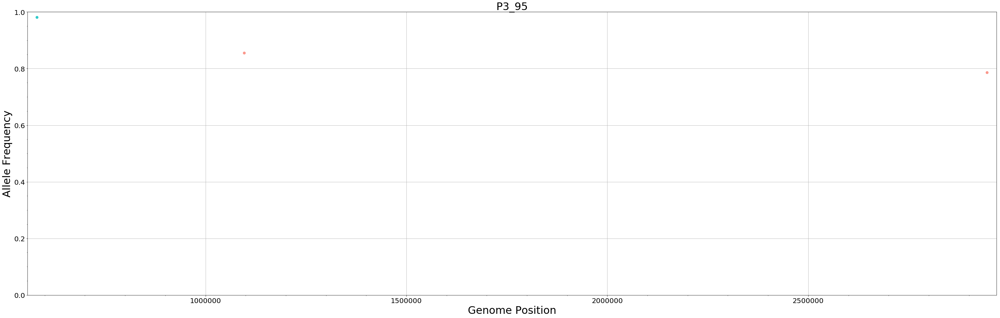

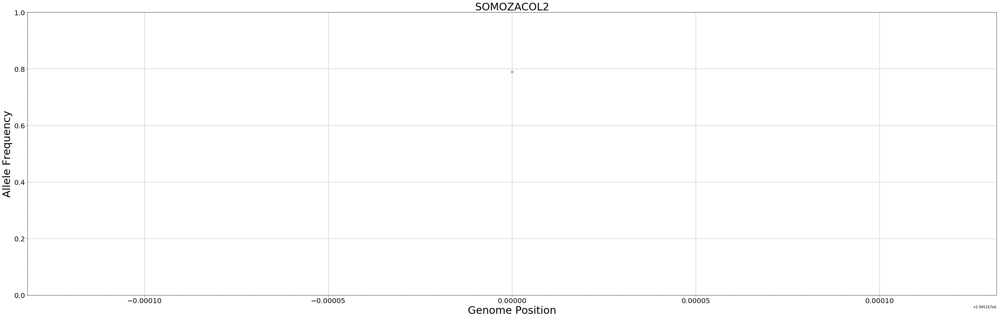

In [13]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

In [14]:
dict_dff['AL14621'][dict_dff['AL14621'].AF < 0.8]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
805,MTB_anc,2945042,.,C,G,448753.42,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.78;DP=38;Exc...,GT:AD:DP:GQ:PL,"0/1:20,18:38:99:426,0,786",1.0,0.5,2.0,1.78,38.0,3.2858,8.992,-0.0254,44.03,0.104,33.07,1.14,1.222,0/1,"20,18",99.0,"426,0,786",NaN,NaN,NaN,2,20.0,18.0,0,1,38.0,0.526316,0.473684,False,38.0,8265.0,1


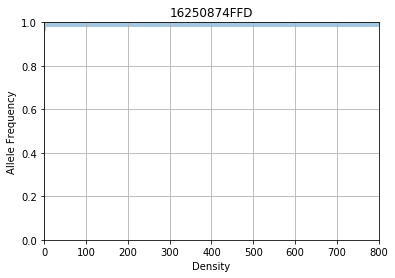

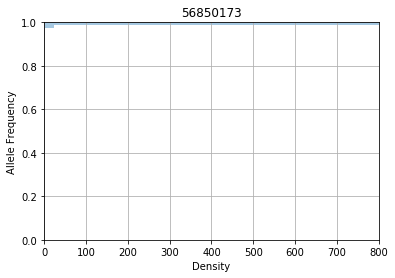

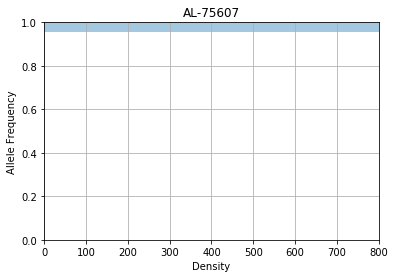

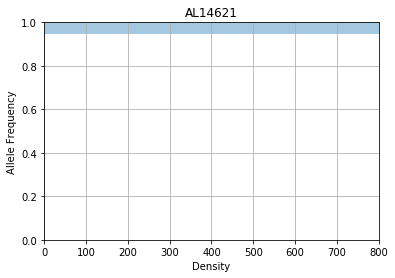

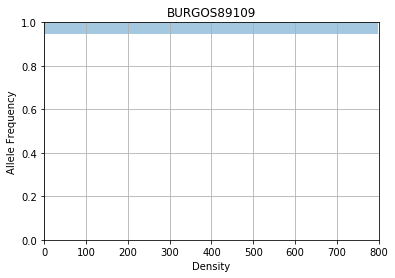

...

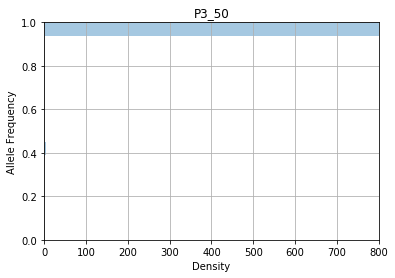

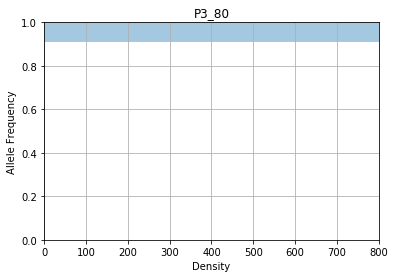

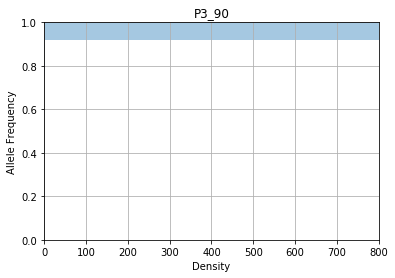

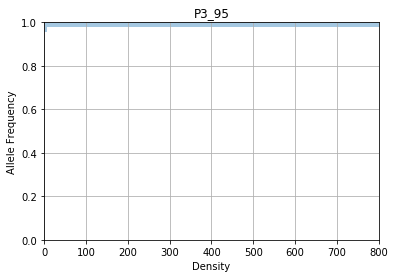

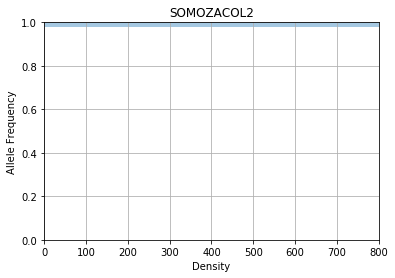

In [15]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [16]:
def split_df_mean(vcf_df, homoz=0.95):
    filter_homoz_top = homoz
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [17]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [18]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

16250874FFD 1 2
56850173 1 1
AL-75607 1 0
AL14621 1 0
BURGOS89109 1 0
P1_50 311 308
P1_80 289 319
P1_90 182 186
P1_95 50 42
P2_50 11 16
P2_80 14 10
P2_90 9 7
P2_95 6 1
P3_50 3 5
P3_80 5 4
P3_90 5 1
P3_95 1 2
SOMOZACOL2 1 0


# Create sets for comparing

In [19]:
B = set(dict_dff['BURGOS89109'].POS.values)
P = set(dict_dff['56850173'].POS.values)
A75 = set(dict_dff['AL-75607'].POS.values)
A14 = set(dict_dff['AL14621'].POS.values)
F = set(dict_dff['16250874FFD'].POS.values)
S = set(dict_dff['SOMOZACOL2'].POS.values)

In [20]:
B_exclusive = B - P
P_exclusive = P - B
Shared_B_P = P & B
total_difference_B_P = (len(B_exclusive) + len(P_exclusive))
print("B has %s unique positions\n\
P has %s unique positions\n\
Both share %s positions\n\
Total difference: %s" % (len(B_exclusive) , len(P_exclusive), len(Shared_B_P),total_difference_B_P ))

B has 296 unique positions
P has 333 unique positions
Both share 504 positions
Total difference: 629


In [21]:
A75_exclusive = A75 - A14
A14_exclusive = A14 - A75
Shared_A75_A14 = A14 & A75

print("A75 has %s unique positions\n\
A14 has %s unique positions\n\
Both share %s positions" % (len(A75_exclusive) , len(A14_exclusive), len(Shared_A75_A14)))

A75 has 15 unique positions
A14 has 10 unique positions
Both share 847 positions


In [22]:
F_exclusive = F - S
S_exclusive = S - F
Shared_F_S = S & F

print("F has %s unique Positions\n\
S has %s unique Sositions\n\
Both share %s Positions" % (len(F_exclusive) , len(S_exclusive), len(Shared_F_S)))

F has 2 unique Positions
S has 4 unique Sositions
Both share 832 Positions


# Use venn diagram to check disgregation

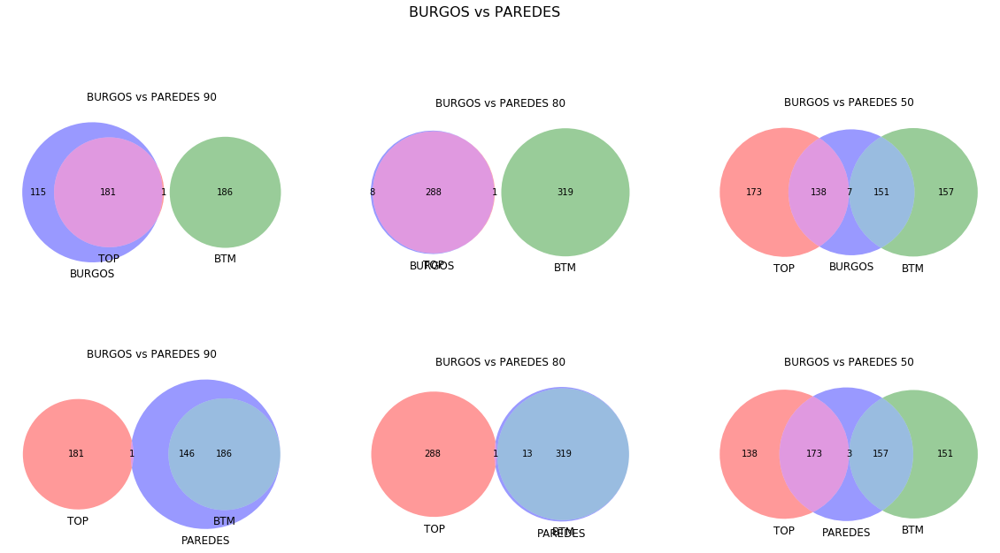

In [37]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 2)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['P1_80'][0]), set(dict_t_b['P1_80'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 3)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['P1_50'][0]), set(dict_t_b['P1_50'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.suptitle('BURGOS vs PAREDES', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 5)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['P1_80'][0]), set(dict_t_b['P1_80'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 6)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['P1_50'][0]), set(dict_t_b['P1_50'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

#v3.get_patch_by_id('100').set_color('r')
#v3.get_patch_by_id('010').set_color('c')
#v3.get_patch_by_id('001').set_color('g')

#v3.get_patch_by_id('101').set_alpha(alpha)
#v3.get_patch_by_id('011').set_alpha(alpha)

#plt.savefig(os.path.join('img', 'P1.svg'), format="svg")

plt.show()

In [24]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
P_not_in_Bttm = P_exclusive - set(dict_t_b['P1_80'][1])
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(P_not_in_Bttm)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
250,MTB_anc,584438,.,G,A,13326.25,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.00;DP=6;Exce...,GT:AD:DP:GQ:PL,"0/1:2,4:6:51:108,0,51",1.0,0.5,2.0,0.0,6.0,0.0,3.031,0.6271,60.0,0.0,32.27,1.11,0.021,0/1,"2,4",51.0,"108,0,51",NaN,NaN,NaN,2,2.0,4.0,0,1,6.0,0.333333,0.666667,False,267.0,73.0,1


In [25]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
Bttm_not_in_P = set(dict_t_b['P1_80'][1]) - P_exclusive
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(Bttm_not_in_P)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10


In [26]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
Top_not_in_B = set(dict_t_b['P1_80'][0]) - B_exclusive
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(Top_not_in_B)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
250,MTB_anc,584438,.,G,A,13326.25,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.00;DP=6;Exce...,GT:AD:DP:GQ:PL,"0/1:2,4:6:51:108,0,51",1.0,0.5,2.0,0.0,6.0,0.0,3.031,0.6271,60.0,0.0,32.27,1.11,0.021,0/1,"2,4",51.0,"108,0,51",NaN,NaN,NaN,2,2.0,4.0,0,1,6.0,0.333333,0.666667,False,267.0,73.0,1


In [27]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
B_not_in_Top = B_exclusive - set(dict_t_b['P1_80'][0])
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(B_not_in_Top)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
443,MTB_anc,1180072,.,G,A,11647.82,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-1.745e+00;DP=7...,GT:AD:DP:GQ:PL,"1/1:2,72:74:99:2105,134,0",2.0,1.0,2.0,-1.745,74.0,0.0000,7.521,0.8355,60.00,0.000,27.87,0.184,0.133,1/1,"2,72",99.0,"2105,134,0",NaN,NaN,NaN,2,2.0,72.0,1,1,74.0,0.027027,0.972973,False,1956.0,3762.0,1
861,MTB_anc,2296406,.,C,A,5651.84,PASS,AC=2;AF=1.00;AN=2;DP=31;ExcessHet=0.0000;FS=0....,GT:AD:DP:GQ:PL,"1/1:0,31:31:92:1024,92,0",2.0,1.0,2.0,NaN,31.0,0.0000,0.000,0.9989,58.33,NaN,32.11,NaN,1.320,1/1,"0,31",92.0,"1024,92,0",NaN,NaN,NaN,2,0.0,31.0,1,1,31.0,0.000000,1.000000,False,7206.0,623.0,1
967,MTB_anc,2626108,.,G,C,296833.09,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=0.292;DP=60;Exc...,GT:AD:DP:GQ:PL,"1/1:0,60:60:99:2269,180,0",2.0,1.0,2.0,0.292,60.0,5.0161,0.000,-0.0657,55.36,1.050,34.71,2.060,0.366,1/1,"0,60",99.0,"2269,180,0",NaN,NaN,NaN,2,0.0,60.0,1,1,60.0,0.000000,1.000000,False,184.0,23.0,1
1228,MTB_anc,3480474,.,A,G,161744.42,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.76;DP=39;Exce...,GT:AD:DP:GQ:PL,"1/1:0,39:39:99:1213,115,0",2.0,1.0,2.0,1.760,39.0,-0.0000,0.000,1.0000,60.00,0.000,27.64,-0.273,0.765,1/1,"0,39",99.0,"1213,115,0",NaN,NaN,NaN,2,0.0,39.0,1,1,39.0,0.000000,1.000000,False,2184.0,315.0,1
1264,MTB_anc,3599912,.,T,C,11620.19,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=2.09;DP=61;Exce...,GT:AD:DP:GQ:PL,"1/1:5,56:61:37:1935,37,0",2.0,1.0,2.0,2.090,61.0,0.0000,3.263,0.8846,60.00,0.000,32.46,0.645,0.469,1/1,"5,56",37.0,"1935,37,0",NaN,NaN,NaN,2,5.0,56.0,1,1,61.0,0.081967,0.918033,False,5788.0,10216.0,1
1316,MTB_anc,3743549,.,G,A,203396.73,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.69;DP=41;Exce...,GT:AD:DP:GQ:PL,"1/1:0,41:41:99:1280,121,0",2.0,1.0,2.0,1.690,41.0,3.0103,0.000,-0.0000,59.98,0.000,33.47,0.969,0.227,1/1,"0,41",99.0,"1280,121,0",NaN,NaN,NaN,2,0.0,41.0,1,1,41.0,0.000000,1.000000,False,4189.0,3296.0,1
1332,MTB_anc,3753415,.,G,C,164749.53,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=1.99;DP=20;Exce...,GT:AD:DP:GQ:PL,"1/1:0,20:20:59:713,59,0",2.0,1.0,2.0,1.990,20.0,3.0103,0.000,-0.0000,53.71,-0.335,33.22,-0.970,0.335,1/1,"0,20",59.0,"713,59,0",NaN,NaN,NaN,2,0.0,20.0,1,1,20.0,0.000000,1.000000,False,251.0,3637.0,1


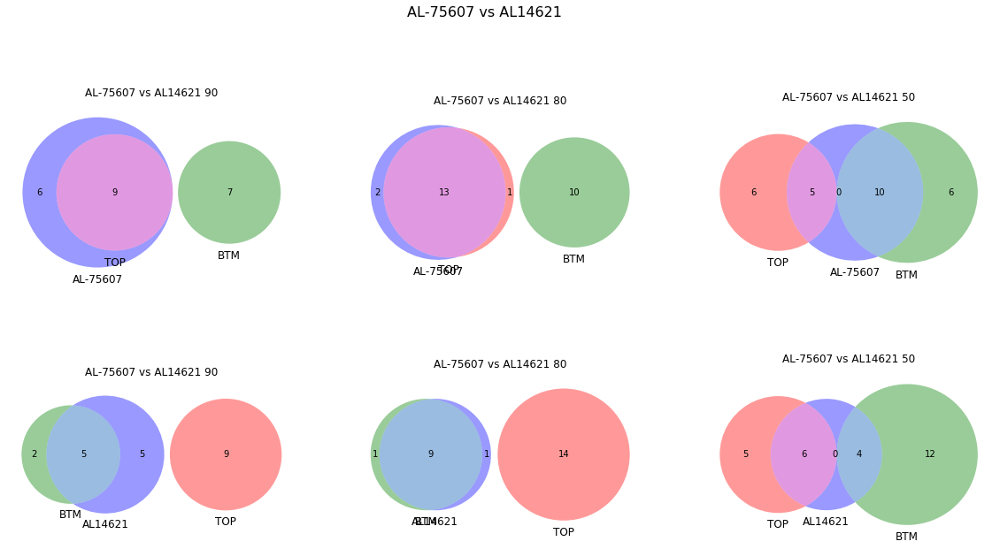

In [25]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("AL-75607 vs AL14621 90")
v3 = venn3([set(dict_t_b['P2_90'][0]), set(dict_t_b['P2_90'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 2)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['P2_80'][0]), set(dict_t_b['P2_80'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 3)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['P2_50'][0]), set(dict_t_b['P2_50'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.suptitle('AL-75607 vs AL14621', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("AL-75607 vs AL14621 90")
v3 = venn3([set(dict_t_b['P2_90'][0]), set(dict_t_b['P2_90'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 5)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['P2_80'][0]), set(dict_t_b['P2_80'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 6)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['P2_50'][0]), set(dict_t_b['P2_50'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

#plt.savefig(os.path.join('img', 'P2L.svg'), format="svg")

plt.show()

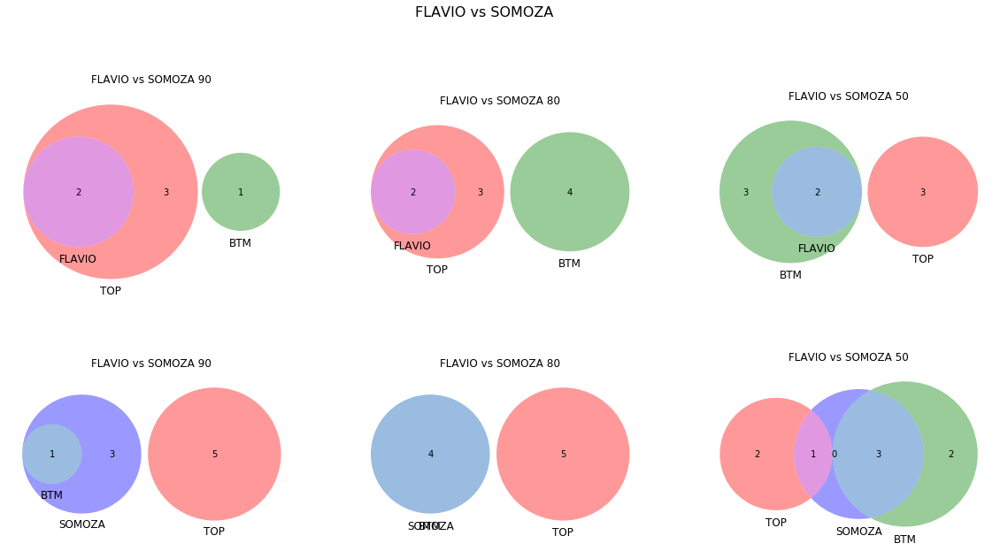

In [26]:
plt.figure(figsize=(20,10))
alpha = 0.2
plt.subplot(2, 3, 1)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['P3_90'][0]), set(dict_t_b['P3_90'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 2)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['P3_80'][0]), set(dict_t_b['P3_80'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 3)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['P3_50'][0]), set(dict_t_b['P3_50'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.suptitle('FLAVIO vs SOMOZA', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['P3_90'][0]), set(dict_t_b['P3_90'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 5)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['P3_80'][0]), set(dict_t_b['P3_80'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 6)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['P3_50'][0]), set(dict_t_b['P3_50'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

"""
v3.get_patch_by_id('100').set_alpha(alpha)
v3.get_patch_by_id('010').set_alpha(alpha)
v3.get_patch_by_id('001').set_alpha(alpha)

v3.get_patch_by_id('101').set_alpha(alpha)
v3.get_patch_by_id('011').set_alpha(alpha)
"""


#plt.savefig(os.path.join('img', 'P3.svg'), format="svg")

plt.show()

/home/laura/env36/lib/python3.6/site-packages/venn/_backwards_compatibility.py:17: UserWarning: `get_labels()` is retained for backwards compatibility; use `generate_petal_labels()` or the higher level `venn()` instead
  "use `generate_petal_labels()` or the higher level `venn()` instead"
/home/laura/env36/lib/python3.6/site-packages/venn/_backwards_compatibility.py:32: UserWarning: `venn3()` is retained for backwards compatibility; use `venn()` instead
  "use `venn()` instead"
/home/laura/env36/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


<Figure size 720x360 with 0 Axes>

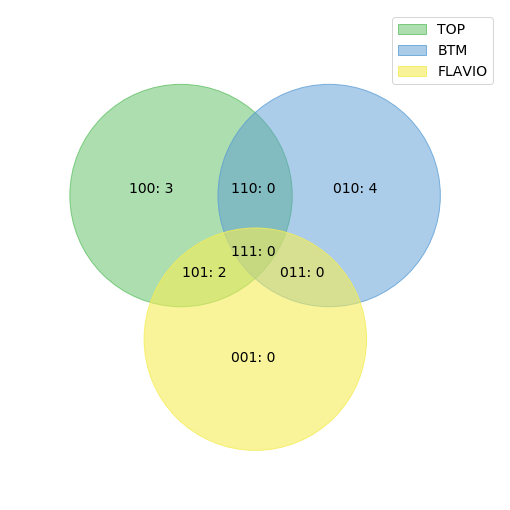

In [30]:
plt.figure(figsize=(10,5))
alpha = 0.2

labels = venn.get_labels([set(dict_t_b['P3_80'][0]), set(dict_t_b['P3_80'][1]), F_exclusive], fill=['number', 'logic'])
fig, ax = venn.venn3(labels, names=['TOP', 'BTM', 'FLAVIO'])
fig.show()

# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [31]:
dict_dff['P1_50'].describe()

,POS,QUAL,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GQ,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.127000e+03,1127.000000,1127.000000,1127.000000,1127.0,1068.000000,1127.000000,1127.000000,1127.000000,1127.000000,1127.000000,1068.000000,1127.000000,1067.000000,1127.000000,1127.000000,1.000000e+01,1127.0,1127.000000,1127.000000,1127.000000,1127.0,1127.000000,1127.000000,1127.000000,1127.000000,1127.000000,1127.0
mean,2.195131e+06,127800.240941,1.450754,0.725377,2.0,0.496977,63.732919,0.859362,1.711322,0.622204,59.882644,0.014184,30.319068,0.337600,0.611232,98.497782,2.131899e+06,2.0,17.392192,46.337178,0.450754,1.0,63.729370,0.272537,0.727463,3399.123336,3416.051464,1.0
std,1.320518e+06,112313.603302,0.497790,0.248895,0.0,1.679433,17.520164,1.762812,3.934569,0.402180,1.101629,0.390058,3.366516,0.917321,0.318403,4.503181,1.421529e+06,0.0,17.536226,21.169868,0.497790,0.0,17.518436,0.256134,0.256134,3491.874555,3431.876073,0.0
min,1.977000e+03,3006.290000,1.000000,0.500000,2.0,-4.556000,6.000000,0.000000,0.000000,-0.273400,40.070000,-4.597000,16.220000,-2.697000,0.008000,18.000000,2.083160e+05,2.0,0.000000,3.000000,0.000000,1.0,6.000000,0.000000,0.187500,16.000000,16.000000,1.0
25%,1.066098e+06,21345.235000,1.000000,0.500000,2.0,-1.018250,52.000000,0.000000,0.000000,-0.000000,60.000000,0.000000,28.090000,-0.283500,0.381000,99.000000,7.692818e+05,2.0,0.000000,29.000000,0.000000,1.0,52.000000,0.000000,0.491377,936.000000,955.000000,1.0
50%,2.156868e+06,125022.890000,1.000000,0.500000,2.0,1.060000,63.000000,0.000000,0.000000,0.828800,60.000000,0.000000,31.090000,0.364000,0.611000,99.000000,2.478676e+06,2.0,18.000000,42.000000,0.000000,1.0,63.000000,0.375000,0.625000,2221.000000,2319.000000,1.0
75%,3.329108e+06,212502.920000,2.000000,1.000000,2.0,1.770000,76.000000,3.010300,1.700500,0.948800,60.000000,0.000000,33.070000,1.045000,0.796500,99.000000,3.135896e+06,2.0,32.000000,61.000000,1.000000,1.0,76.000000,0.508623,1.000000,4762.000000,4803.000000,1.0
max,4.408156e+06,448753.420000,2.000000,1.000000,2.0,5.300000,130.000000,32.294600,48.405000,1.000000,60.000000,7.940000,37.690000,3.330000,2.100000,99.000000,4.394177e+06,2.0,66.000000,130.000000,1.000000,1.0,130.000000,0.812500,1.000000,21698.000000,21698.000000,1.0


/home/laura/env36/lib/python3.6/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


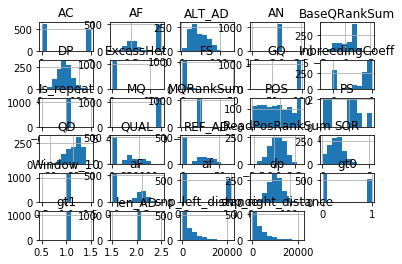

In [32]:
dict_dff['P1_50'].hist()
plt.show()

In [33]:
def assign_group_P1(row):
    if row.POS in B_exclusive:
        return 1
    elif row.POS in P_exclusive:
        return 2
    else:
        return 3


In [34]:
def assign_group_P2(row):
    if row.POS in A75_exclusive:
        return 1
    elif row.POS in A14_exclusive:
        return 2
    else:
        return 3


In [35]:
Atest5 = dict_dff['P2_50'][(dict_dff['P2_50'].AC != 2) & (dict_dff['P2_50'].gt0 != 1)]
Atest8 = dict_dff['P2_80'][(dict_dff['P2_80'].AC != 2) & (dict_dff['P2_80'].gt0 != 1)]


Ktest5 = dict_dff['P1_50'][(dict_dff['P1_50'].AC != 2) & (dict_dff['P1_50'].gt0 != 1)]
Ktest8 = dict_dff['P1_80'][(dict_dff['P1_80'].AC != 2) & (dict_dff['P1_80'].gt0 != 1)]
Ktest9 = dict_dff['P1_90'][(dict_dff['P1_90'].AC != 2) & (dict_dff['P1_90'].gt0 != 1)]
Ktest95 = dict_dff['P1_95'][(dict_dff['P1_95'].AC != 2) & (dict_dff['P1_95'].gt0 != 1)]

In [36]:
Ktest5.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
0,MTB_anc,1977,.,G,A,21377.81,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.720;DP=54;Ex...,GT:AD:DP:GQ:PL,"0/1:34,20:54:99:571,0,1117",1.0,0.5,2.0,0.72,54.0,0.0,2.265,0.7998,60.0,0.0,30.72,0.655,0.490,0/1,"34,20",99.0,"571,0,1117",NaN,NaN,NaN,2,34.0,20.0,0,1,54.0,0.629630,0.370370,False,1977.0,555.0,1
2,MTB_anc,6140,.,G,T,22254.13,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.43;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:28,46:74:99:1388,0,597",1.0,0.5,2.0,1.43,74.0,0.0,0.919,0.8374,60.0,0.0,29.48,-0.273,0.827,0/1,"28,46",99.0,"1388,0,597",NaN,NaN,NaN,2,28.0,46.0,0,1,74.0,0.378378,0.621622,False,3608.0,1445.0,1
3,MTB_anc,7585,.,C,G,34897.47,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.27;DP=79;Exc...,GT:AD:DP:GQ:PL,"0/1:47,32:79:99:920,0,1429",1.0,0.5,2.0,1.27,79.0,0.0,0.000,0.8559,60.0,0.0,32.58,-0.405,0.565,0/1,"47,32",99.0,"920,0,1429",NaN,NaN,NaN,2,47.0,32.0,0,1,79.0,0.594937,0.405063,False,1445.0,1558.0,1
5,MTB_anc,9304,.,A,G,36506.74,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.59;DP=77;Exc...,GT:AD:DP:GQ:PL,"0/1:35,42:77:99:1307,0,908",1.0,0.5,2.0,1.59,77.0,0.0,2.747,0.8888,60.0,0.0,33.40,-0.480,0.449,0/1,"35,42",99.0,"1307,0,908",NaN,NaN,NaN,2,35.0,42.0,0,1,77.0,0.454545,0.545455,False,161.0,1437.0,1
6,MTB_anc,10741,.,C,G,24890.54,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.52;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:42,32:74:99:853,0,1395",1.0,0.5,2.0,1.52,74.0,0.0,4.721,0.7605,60.0,0.0,30.47,-0.615,1.392,0/1,"42,32",99.0,"853,0,1395",NaN,NaN,NaN,2,42.0,32.0,0,1,74.0,0.567568,0.432432,False,1437.0,2719.0,1


In [37]:
Atest5['category'] = Atest5.apply(assign_group_P2, axis=1)
Atest8['category'] = Atest8.apply(assign_group_P2, axis=1)


Ktest5['category'] = Ktest5.apply(assign_group_P1, axis=1)
Ktest8['category'] = Ktest8.apply(assign_group_P1, axis=1)
Ktest9['category'] = Ktest9.apply(assign_group_P1, axis=1)
Ktest95['category'] = Ktest95.apply(assign_group_P1, axis=1)

/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [39]:
Ktest5[Ktest5.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category


In [41]:
Atest5 = Atest5[Atest5.category != 3]
Atest8 = Atest8[Atest8.category != 3]

Ktest5 = Ktest5[Ktest5.category != 3]
Ktest8 = Ktest8[Ktest8.category != 3]
Ktest9 = Ktest9[Ktest9.category != 3]
Ktest95 = Ktest95[Ktest95.category != 3]

In [42]:
Atest5.to_csv("categories/Atest5.tsv", sep='\t', index=False)
Atest8.to_csv("categories/Atest8.tsv", sep='\t', index=False)


Ktest5.to_csv("categories/Ktest5.tsv", sep='\t', index=False)
Ktest8.to_csv("categories/Ktest8.tsv", sep='\t', index=False)
Ktest9.to_csv("categories/Ktest9.tsv", sep='\t', index=False)
Ktest95.to_csv("categories/Ktest95.tsv", sep='\t', index=False)

In [43]:
Ktest8.gt0[Ktest8.category == 1].value_counts()

0    288
Name: gt0, dtype: int64

In [44]:
Atest8.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
38,MTB_anc,127870,.,A,G,2867.71,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.30;DP=45;Exc...,GT:AD:DP:GQ:PL,"0/1:33,12:45:99:288,0,963",1.0,0.5,2.0,2.300,45.0,0.1362,8.532,0.3462,60.0,0.0,15.34,-1.432,1.223,0/1,"33,12",99.0,"288,0,963",NaN,NaN,NaN,2,33.0,12.0,0,1,45.0,0.733333,0.266667,False,1067.0,9813.0,1,2
51,MTB_anc,203868,.,C,A,2276.32,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.323e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:6,13:19:99:331,0,200",1.0,0.5,2.0,-3.323,19.0,0.1373,14.765,0.3114,60.0,0.0,20.69,-1.105,0.339,0/1,"6,13",99.0,"331,0,200",NaN,NaN,NaN,2,6.0,13.0,0,1,19.0,0.315789,0.684211,False,1972.0,2613.0,1,1
175,MTB_anc,458923,.,C,T,3262.61,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-9.210e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:60,12:72:99:197,0,1847",1.0,0.5,2.0,-0.921,72.0,0.0903,7.753,0.4339,60.0,0.0,15.10,-0.224,0.369,0/1,"60,12",99.0,"197,0,1847",NaN,NaN,NaN,2,60.0,12.0,0,1,72.0,0.833333,0.166667,False,1471.0,8581.0,1,2
200,MTB_anc,549592,.,C,T,3142.46,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.504e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:64,14:80:99:225,0,1958",1.0,0.5,2.0,-1.504,80.0,0.0544,1.090,0.4518,60.0,0.0,15.11,1.430,0.809,0/1,"64,14",99.0,"225,0,1958",NaN,NaN,NaN,2,64.0,14.0,0,1,78.0,0.820513,0.179487,False,3235.0,1933.0,1,2
236,MTB_anc,690276,.,T,C,7970.47,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.816;DP=57;Ex...,GT:AD:DP:GQ:PL,"0/1:12,45:57:99:1354,0,263",1.0,0.5,2.0,0.816,57.0,0.0001,2.701,0.7178,60.0,0.0,26.13,0.894,0.518,0/1,"12,45",99.0,"1354,0,263",NaN,NaN,NaN,2,12.0,45.0,0,1,57.0,0.210526,0.789474,False,28.0,174.0,1,1


In [45]:
Atest8.isna().any()

#CHROM                False
POS                   False
ID                    False
REF                   False
ALT                   False
QUAL                  False
FILTER                False
INFO                  False
FORMAT                False
sample                False
AC                    False
af                    False
AN                    False
BaseQRankSum          False
DP                    False
ExcessHet             False
FS                    False
InbreedingCoeff       False
MQ                    False
MQRankSum             False
QD                    False
ReadPosRankSum        False
SOR                   False
GT                    False
AD                    False
GQ                    False
PL                    False
PGT                    True
PID                    True
PS                     True
len_AD                False
REF_AD                False
ALT_AD                False
gt0                   False
gt1                   False
dp                  

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


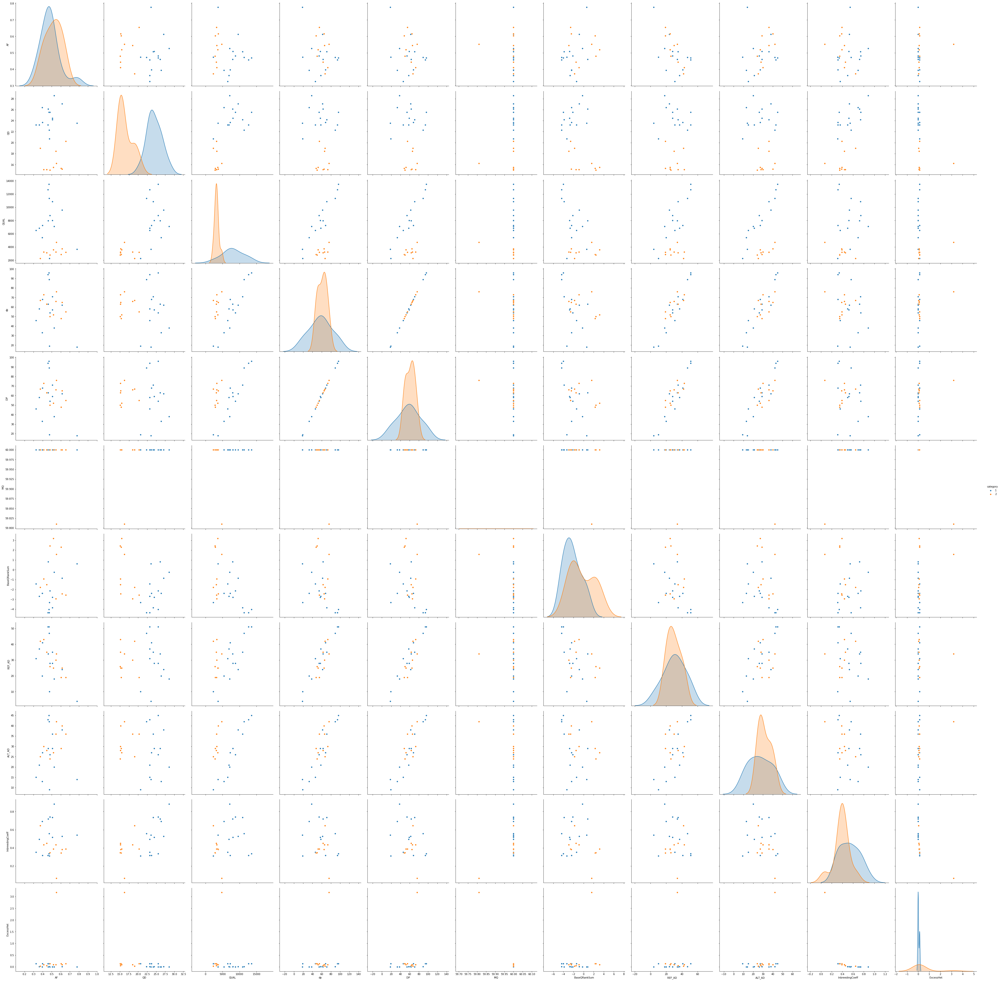

In [46]:
sns.pairplot(Atest5, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum","REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

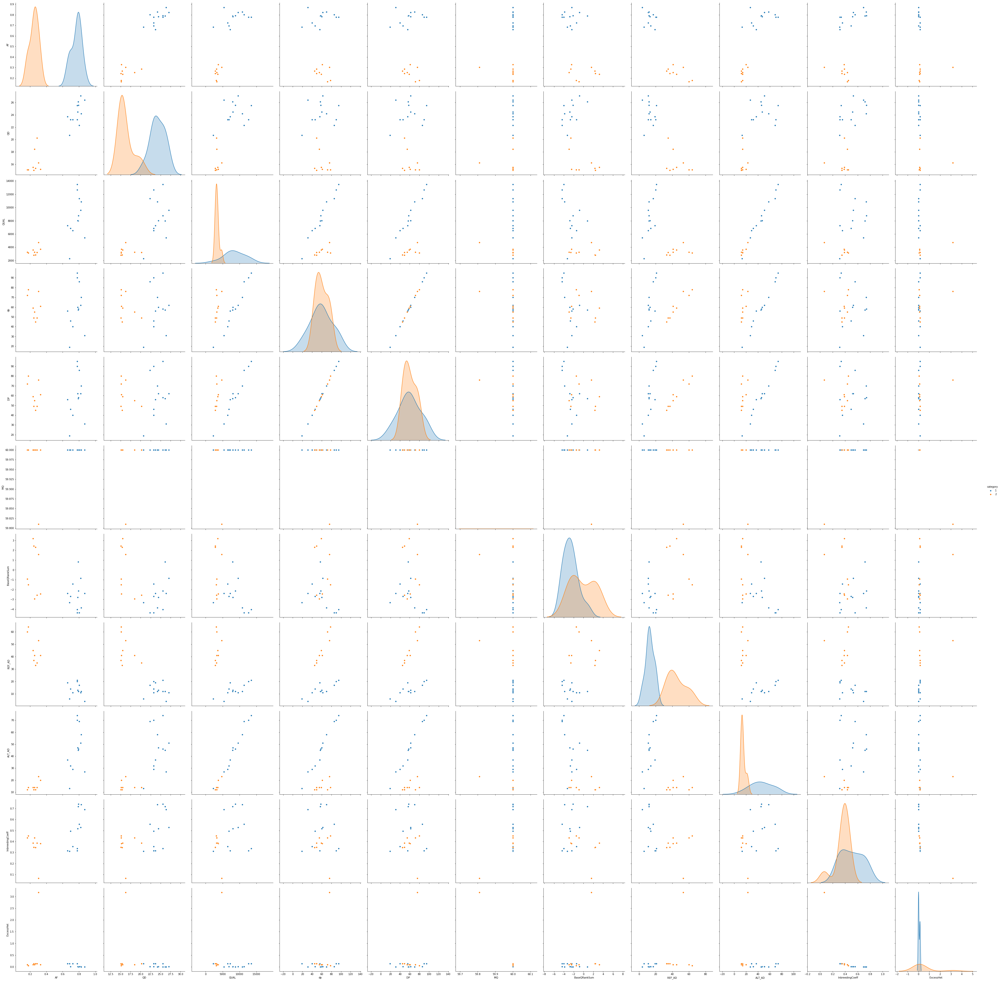

In [50]:
sns.pairplot(Atest8, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum","REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

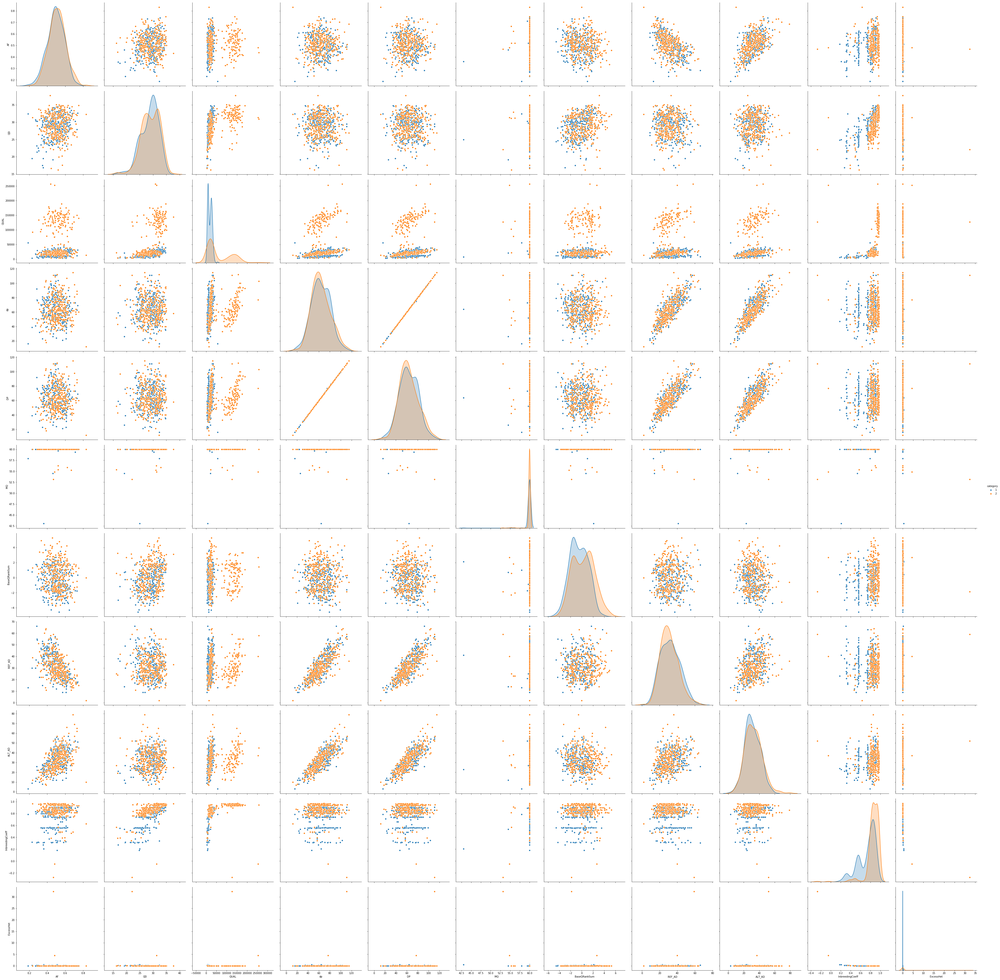

In [51]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

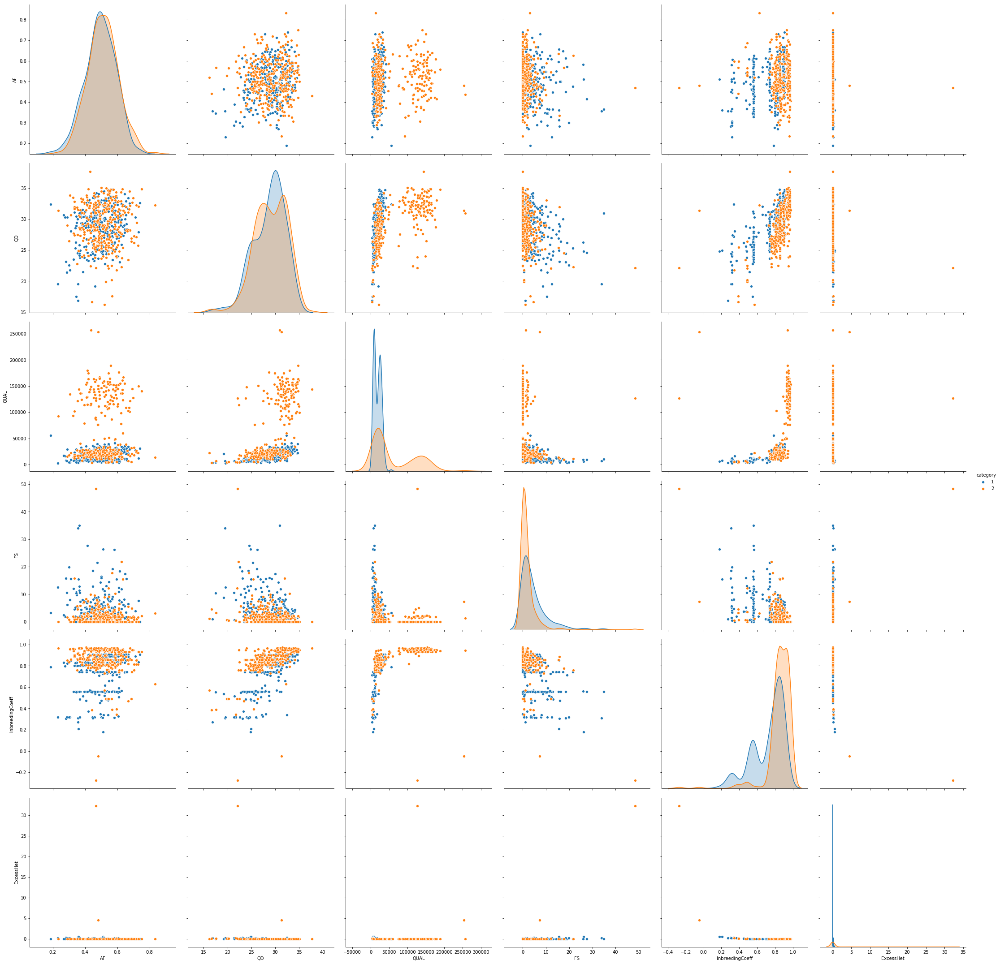

In [52]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "FS","InbreedingCoeff", "ExcessHet"],kind='scatter')

In [138]:
Ktest5["category"][(Ktest5.InbreedingCoeff > 0.87)].value_counts()

2    157
1     61
Name: category, dtype: int64

In [125]:
Ktest5["InbreedingCoeff"].describe()

count    619.000000
mean       0.799688
std        0.164810
min       -0.273400
25%        0.772650
50%        0.853700
75%        0.900000
max        0.974900
Name: InbreedingCoeff, dtype: float64

In [135]:
Ktest5["QD"].describe()

count    619.000000
mean      28.972488
std        3.362454
min       16.220000
25%       26.640000
50%       29.270000
75%       31.510000
max       37.690000
Name: QD, dtype: float64

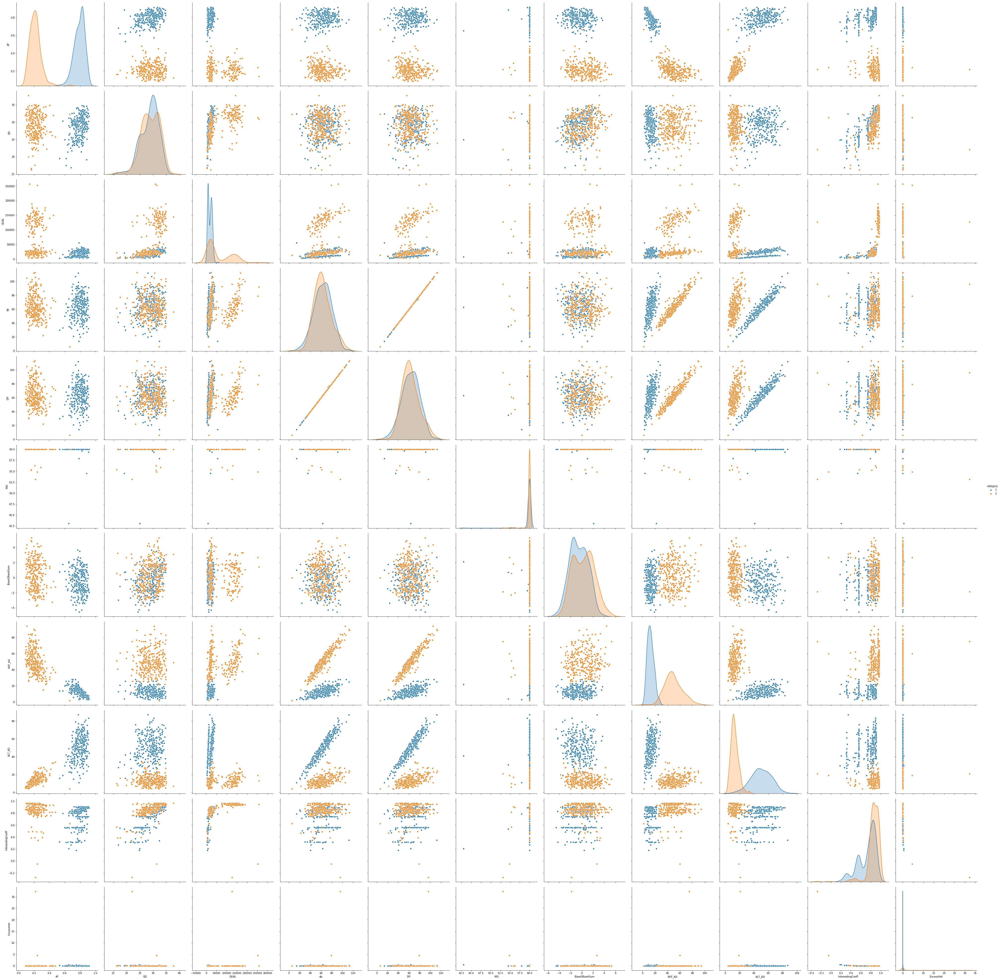

In [53]:
sns.pairplot(Ktest8, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

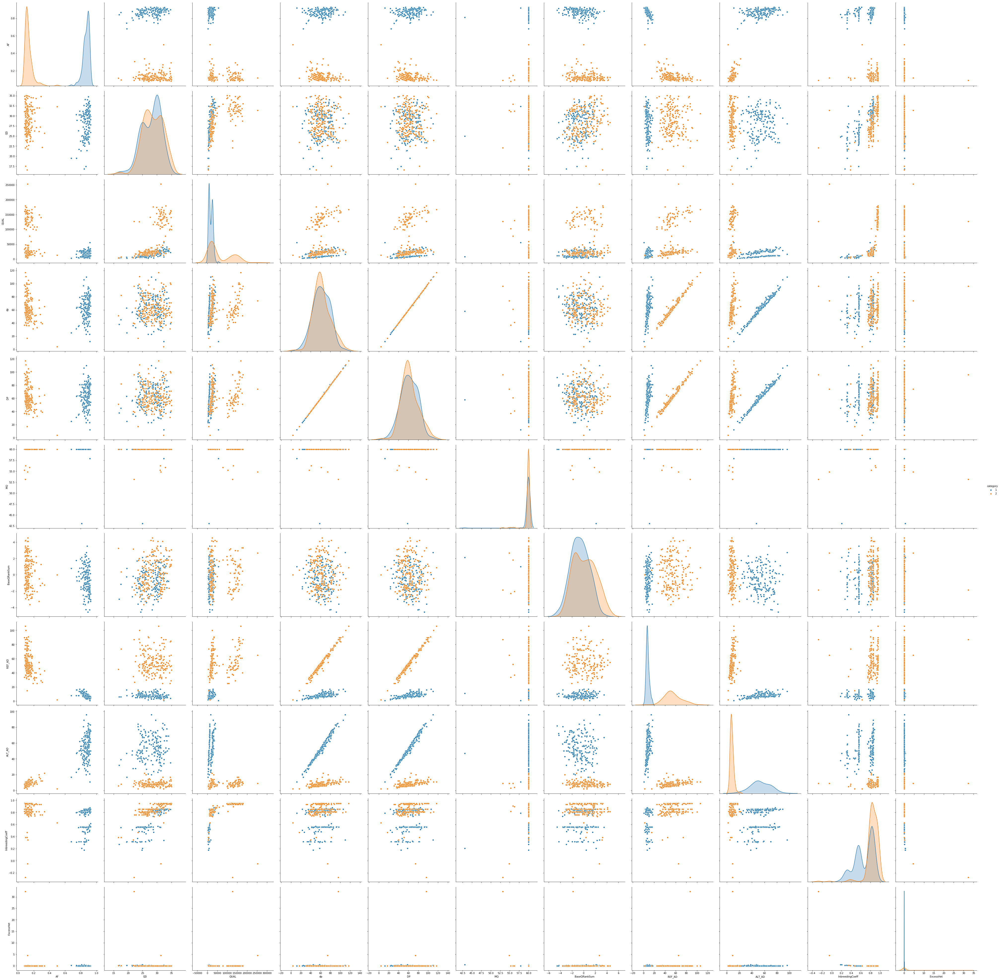

In [54]:
sns.pairplot(Ktest9, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

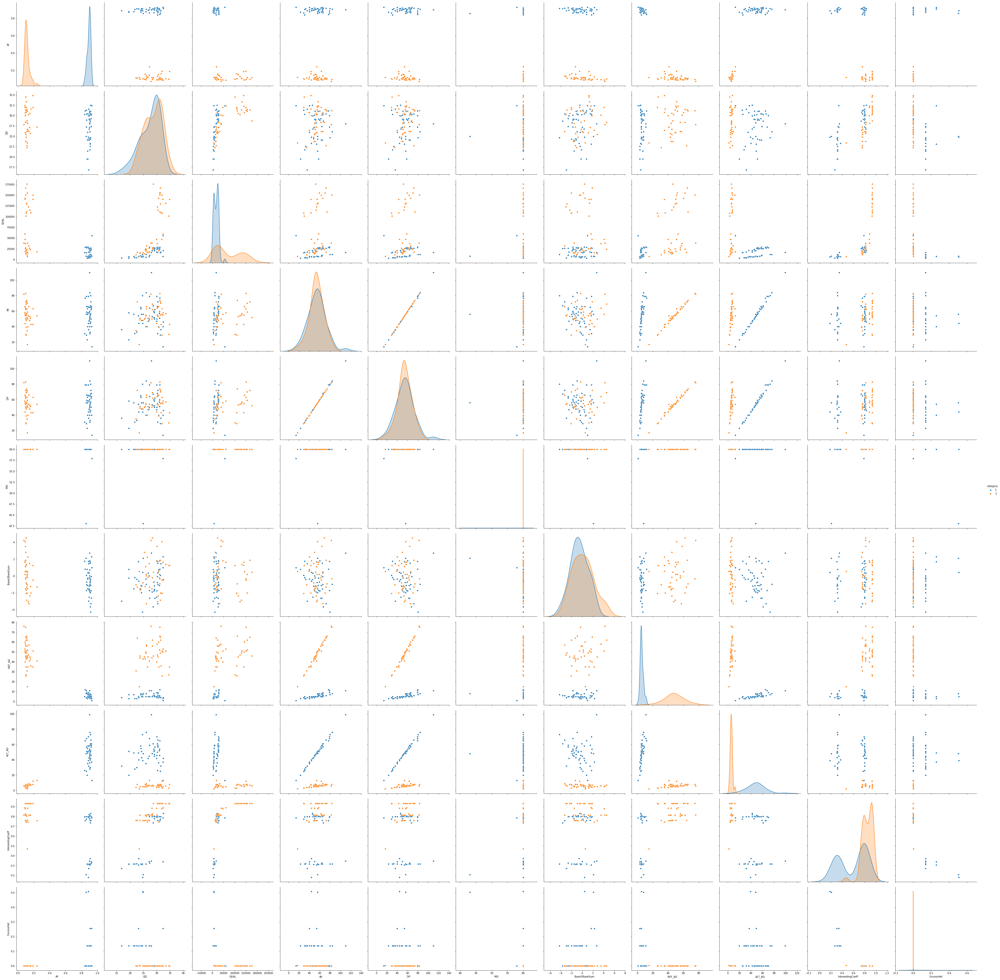

In [97]:
sns.pairplot(Ktest95, hue='category',size=5,vars=["AF","QD", "QUAL","dp", "DP", "MQ","BaseQRankSum",
                                                 "REF_AD", "ALT_AD", "InbreedingCoeff", "ExcessHet"],kind='scatter')

In [57]:
X = np.array(Ktest5[["QUAL", "QD", "AF", "REF_AD", "ALT_AD", "InbreedingCoeff"]])
y = np.array(Ktest5['category'])
X.shape

(619, 6)

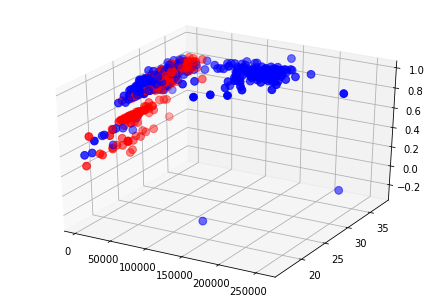

In [59]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y:
    assign.append(colors[row - 1])
ax.scatter(X[:, 0], X[:, 1], X[:, 5], c=assign,s=60)

In [60]:
X8 = np.array(Ktest8[["AF","QUAL", "ALT_AD", "QD", "REF_AD"]])
y8 = np.array(Ktest8['category'])
X8.shape

(608, 5)

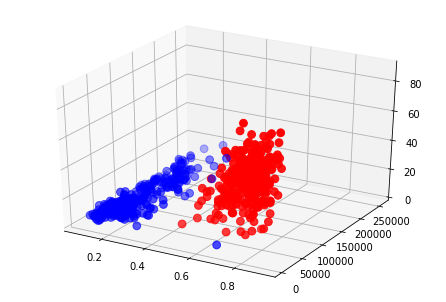

In [61]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y8:
    assign.append(colors[row - 1])
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)

In [62]:
X9 = np.array(Ktest9[["AF","QUAL", "ALT_AD", "QD", "REF_AD"]])
y9 = np.array(Ktest9['category'])
X9.shape

(368, 5)

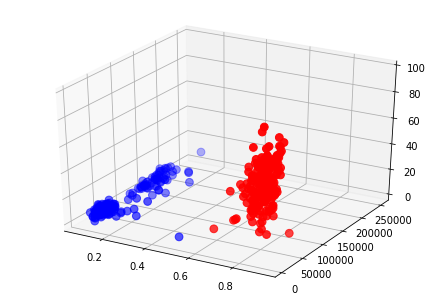

In [63]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y9:
    assign.append(colors[row - 1])
ax.scatter(X9[:, 0], X9[:, 1], X9[:, 2], c=assign,s=60)

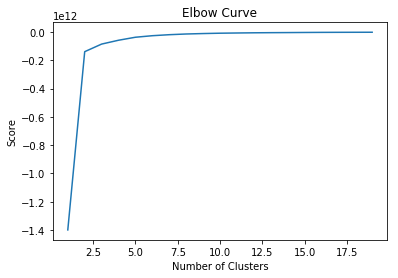

In [64]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [83]:
X = np.array(Ktest5[["QUAL", "QD", "InbreedingCoeff", "ExcessHet"]])
y = np.array(Ktest5['category'])
X

array([[ 2.137781e+04,  3.072000e+01,  7.998000e-01,  0.000000e+00],
       [ 2.225413e+04,  2.948000e+01,  8.374000e-01,  0.000000e+00],
       [ 3.489747e+04,  3.258000e+01,  8.559000e-01,  0.000000e+00],
       ...,
       [ 1.280628e+04,  2.796000e+01,  7.414000e-01,  1.000000e-04],
       [ 2.788313e+04,  2.575000e+01,  8.102000e-01,  0.000000e+00],
       [ 1.758405e+05,  2.871000e+01,  9.336000e-01, -0.000000e+00]])

In [84]:
X = StandardScaler().fit_transform(X)
X

array([[-4.23557926e-01,  5.20133593e-01,  6.82789165e-04,
        -5.13674589e-02],
       [-4.05123858e-01,  1.51057093e-01,  2.29009056e-01,
        -5.13674589e-02],
       [-1.39161431e-01,  1.07374834e+00,  3.41350437e-01,
        -5.13674589e-02],
       ...,
       [-6.03866683e-01, -3.01359261e-01, -3.53951625e-01,
        -5.12910920e-02],
       [-2.86713493e-01, -9.59148829e-01,  6.38368629e-02,
        -5.13674589e-02],
       [ 2.82568412e+00, -7.81275075e-02,  8.13184237e-01,
        -5.13674589e-02]])

In [85]:
kmeans = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X)
centroids = kmeans.cluster_centers_
print(centroids)

[[-0.45014772 -0.21067007 -0.19769262  0.00501596]
 [ 1.95193365  0.913509    0.85723609 -0.02175024]]


In [86]:
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [87]:
X8 = np.array(Ktest8[["AF","QUAL", "ALT_AD", "QD", "REF_AD"]])
y8 = np.array(Ktest8['category'])
X8 = StandardScaler().fit_transform(X8)

X8.shape

(608, 5)

In [88]:
kmeans8 = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X8)
centroids8 = kmeans8.cluster_centers_
print(centroids8)

[[-0.92955419  0.44257934 -0.82956227  0.03683118  0.82512574]
 [ 1.01930425 -0.48531114  0.90965794 -0.04038729 -0.90479305]]


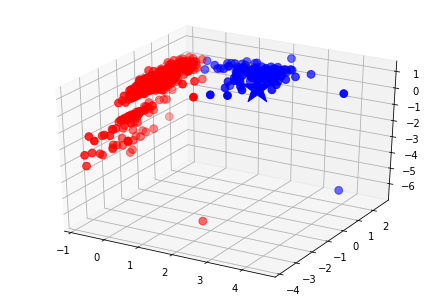

In [89]:
# Predicting the clusters
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)
ax.scatter(C[:, 0], C[:, 1], marker='*', c=colors, s=1000)

In [90]:
metrics.adjusted_rand_score(Ktest5['category'].values, labels)

0.09276457343816132

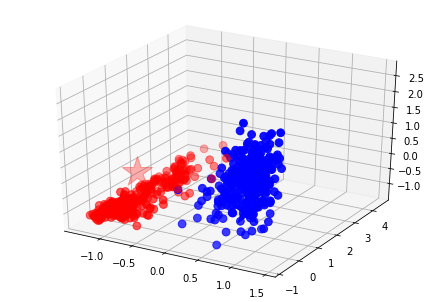

In [91]:
# Predicting the clusters
labels8 = kmeans8.predict(X8)
# Getting the cluster centers
C8 = kmeans8.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels8:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)
ax.scatter(C8[:, 0], C8[:, 1], marker='*', c=colors, s=1000)

In [92]:
metrics.adjusted_rand_score(Ktest8['category'].values, labels8)

0.9868637751288168

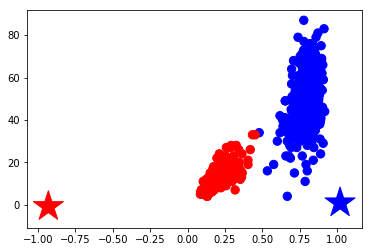

In [93]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['ALT_AD'].values

plt.scatter(f1, f2, c=assign, s=70)
plt.scatter(C8[:, 0], C8[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [94]:
copy =  pd.DataFrame()
copy['POS']=Ktest8['POS'].values
copy['AF']=Ktest8['AF'].values
copy['category']=Ktest8['category'].values
copy['label'] = labels8;
Ngrouped =  pd.DataFrame()
Ngrouped['colors']=colors
Ngrouped['N']=copy.groupby('label').size()
Ngrouped

,colors,N
0,red,318
1,blue,290


In [95]:
copy.head()

,POS,AF,category,label
0,1977,0.761905,1,1
1,6140,0.173077,2,0
2,7585,0.694444,1,1
3,9304,0.833333,1,1
4,10741,0.705882,1,1


In [65]:
 #metrics.adjusted_rand_score(labels_true, labels_pred)

# Compute Affinity Propagation

In [96]:
# #############################################################################
# Compute Affinity Propagation
X = X8
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))


Estimated number of clusters: 7
Silhouette Coefficient: 0.486


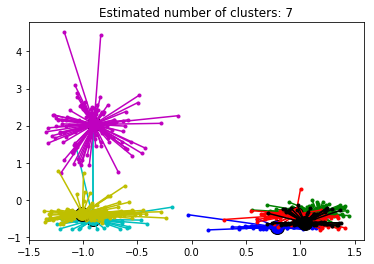

In [97]:

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Compute Agglomerative Clustering

In [104]:
Ktest8.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category'],
      dtype='object')

In [122]:
#X5 = np.array(Ktest5[["QUAL", "QD","ExcessHet", "InbreedingCoeff"]])
X5 = np.array(Ktest5[["QUAL", "InbreedingCoeff", "QD", "AF"]])
X5 = StandardScaler().fit_transform(X5)

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X5)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_


In [123]:
Ktest5['Label'] = labels
metrics.adjusted_rand_score(Ktest5['category'].values, labels)

0.09478452551465266

In [105]:
X8 = np.array(Ktest8[["AF", "ALT_AD","REF_AD", "InbreedingCoeff"]])

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X8)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_


In [108]:
Ktest8['Label'] = labels
metrics.adjusted_rand_score(Ktest8['category'].values, labels)

0.9868637751288168

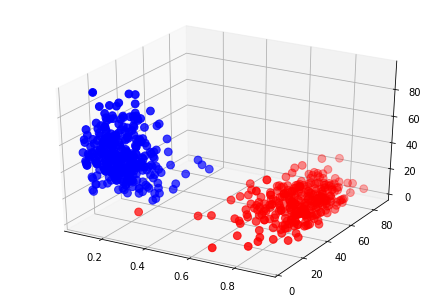

In [107]:
# Predicting the clusters

# Getting the cluster centers
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)


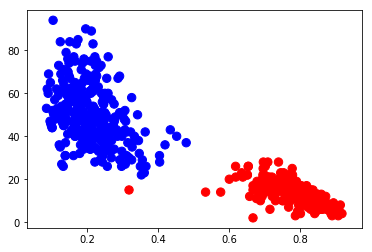

In [109]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['REF_AD'].values

colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

plt.scatter(f1, f2, c=assign, s=70)
plt.show()

# PCA: Principal Component Analysis
---
---

In [73]:
#cargamos los datos de entrada
dataframe = Ktest8
dataframe.tail(10)


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category,Label
1489,MTB_anc,4391553,.,C,T,20902.35,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.070e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:61,9:70:99:128,0,2057",1.0,0.5,2.0,-0.707,70.0,0.0021,7.365,0.7750,60.0,0.0,28.44,1.700,1.469,0/1,"61,9",99.0,"128,0,2057",NaN,NaN,NaN,2,61.0,9.0,0,1,70.0,0.871429,0.128571,False,5325.0,26.0,1,2,1
1490,MTB_anc,4391579,.,C,G,28977.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.450e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:9,62:71:99:2205,0,143",1.0,0.5,2.0,-0.245,71.0,0.0021,8.138,0.7750,60.0,0.0,31.92,0.085,0.114,0/1,"9,62",99.0,"2205,0,143",NaN,NaN,NaN,2,9.0,62.0,0,1,71.0,0.126761,0.873239,False,26.0,229.0,1,1,0
1491,MTB_anc,4391808,.,C,T,9786.81,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.340e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:21,52:73:99:1560,0,533",1.0,0.5,2.0,-1.340,73.0,0.1954,27.577,0.4677,60.0,0.0,24.71,0.530,1.052,0/1,"21,52",99.0,"1560,0,533",NaN,NaN,NaN,2,21.0,52.0,0,1,73.0,0.287671,0.712329,False,229.0,1370.0,1,1,0
1495,MTB_anc,4395964,.,C,A,21891.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.942e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:55,9:64:99:138,0,1854",1.0,0.5,2.0,-1.942,64.0,0.0069,2.875,0.7203,60.0,0.0,28.43,1.640,0.428,0/1,"55,9",99.0,"138,0,1854",NaN,NaN,NaN,2,55.0,9.0,0,1,64.0,0.859375,0.140625,False,577.0,3972.0,1,2,1
1496,MTB_anc,4399936,.,G,T,9462.82,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.431e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:11,57:68:99:1596,0,240",1.0,0.5,2.0,-2.431,68.0,0.1954,6.584,0.4679,60.0,0.0,24.33,-0.104,0.922,0/1,"11,57",99.0,"1596,0,240",NaN,NaN,NaN,2,11.0,57.0,0,1,68.0,0.161765,0.838235,False,3972.0,1817.0,1,1,0
1497,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:12,81:93:99:2411,0,240",1.0,0.5,2.0,-3.022,93.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"12,81",99.0,"2411,0,240",NaN,NaN,NaN,2,12.0,81.0,0,1,93.0,0.129032,0.870968,False,1817.0,2147.0,1,1,0
1498,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=60;Exc...,GT:AD:DP:GQ:PL,"0/1:47,13:60:99:387,0,1457",1.0,0.5,2.0,3.520,60.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"47,13",99.0,"387,0,1457",NaN,NaN,NaN,2,47.0,13.0,0,1,60.0,0.783333,0.216667,False,2147.0,3210.0,1,2,1
1499,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:20,70:90:99:2170,0,439",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"20,70",99.0,"2170,0,439",NaN,NaN,NaN,2,20.0,70.0,0,1,90.0,0.222222,0.777778,False,3210.0,478.0,1,1,0
1501,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:66,17:83:99:296,0,1912",1.0,0.5,2.0,-0.655,83.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"66,17",99.0,"296,0,1912",NaN,NaN,NaN,2,66.0,17.0,0,1,83.0,0.795181,0.204819,False,382.0,186.0,1,2,1
1502,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=58;Ex...,GT:AD:DP:GQ:PL,"0/1:38,20:58:99:506,0,1112",1.0,0.5,2.0,0.456,58.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"38,20",99.0,"506,0,1112",NaN,NaN,NaN,2,38.0,20.0,0,1,58.0,0.655172,0.344828,False,186.0,764.0,1,2,1


In [74]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo

In [75]:
df.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
0,0.761905,30.57,19963.51,0.434,42.0,42.0,60.0,0.0,1.003,99.0,0.72,0.0442,10.0,32.0,0.655
2,0.173077,29.67,22403.11,0.827,52.0,52.0,60.0,0.0,0.919,99.0,1.43,0.0069,43.0,9.0,-0.273
3,0.694444,32.33,31938.04,0.573,72.0,72.0,60.0,0.0,0.994,99.0,1.27,0.0111,22.0,50.0,-0.405
5,0.833333,33.15,33683.24,0.412,84.0,84.0,60.0,0.0,2.716,99.0,1.59,0.0021,14.0,70.0,-0.480
6,0.705882,30.67,25056.54,1.392,68.0,68.0,60.0,0.0,4.721,99.0,1.52,0.0442,20.0,48.0,-0.615


In [76]:
X_scaled.shape

(621, 15)

In [77]:
#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA

In [78]:
pca

PCA(copy=True, iterated_power='auto', n_components=0.85, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [79]:
print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 8 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (621, 8)
[0.1975217  0.18839519 0.12436442 0.10968146 0.08140738 0.06342859
 0.06146967 0.05414755]
suma: 0.8804159524723986


In [80]:
np.cumsum(pca.explained_variance_ratio_)

array([0.1975217 , 0.38591689, 0.51028131, 0.61996277, 0.70137015,
       0.76479873, 0.82626841, 0.88041595])

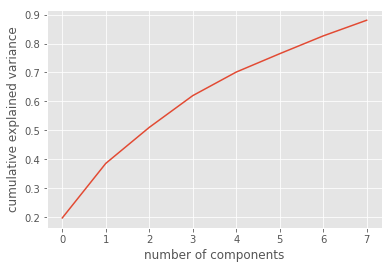

In [81]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

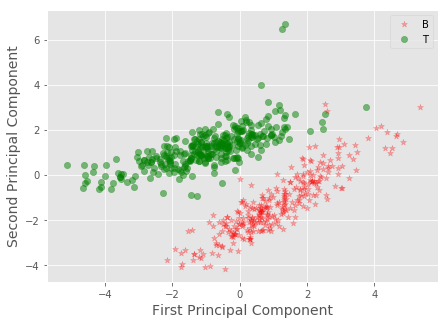

In [82]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=dataframe['Label'].values
cdict={0:'red',1:'green'}
labl={0:'B',1:'T'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [83]:
pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,0.344782,-0.051233,-0.393589,0.046382,-0.419408,-0.419405,-0.041494,-0.023573,0.284788,-0.109235,-0.129949,0.078110,-0.476931,0.153398,-0.018348
2,-0.459459,-0.216413,-0.239633,0.103192,-0.299582,-0.299734,-0.152871,-0.105188,0.109227,-0.104833,0.175789,0.041711,0.313332,-0.549420,0.066065
3,0.033483,-0.482897,-0.215588,0.227778,0.311079,0.310949,-0.291675,-0.040425,0.346883,0.090629,-0.168400,0.444713,0.107031,0.134819,-0.053471
4,0.086483,0.329522,0.145820,0.222587,0.084385,0.084542,-0.490318,-0.484663,0.179750,-0.389957,0.330707,-0.129500,-0.036496,0.102601,0.034299
5,0.040646,0.248136,0.135604,0.060888,-0.044508,-0.044441,-0.087793,0.512430,0.087505,0.027739,0.409298,0.496855,-0.042303,0.007906,0.464504
6,-0.060714,0.120037,0.168680,-0.453811,-0.044987,-0.045079,-0.244736,0.236104,0.026797,-0.372458,-0.103899,0.329023,0.033316,-0.068664,-0.602903
7,0.022604,0.138653,0.022240,0.637881,-0.069181,-0.068631,0.072554,0.128584,-0.134757,0.289274,0.256186,0.073043,-0.033952,-0.019756,-0.605999
8,-0.000895,-0.064271,0.047912,0.481274,0.026587,0.026591,0.187583,0.225378,-0.241730,-0.684092,-0.357259,0.018531,0.040409,-0.019978,0.134640


In [84]:
#cargamos los datos de entrada
dataframe = Ktest5
dataframe.tail()


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
1530,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:31,48:79:99:1342,0,986",1.0,0.5,2.0,-3.022,79.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"31,48",99.0,"1342,0,986",NaN,NaN,NaN,2,31.0,48.0,0,1,79.0,0.392405,0.607595,False,1817.0,2147.0,1,1
1531,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=63;Exc...,GT:AD:DP:GQ:PL,"0/1:25,38:63:99:1311,0,671",1.0,0.5,2.0,3.520,63.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"25,38",99.0,"1311,0,671",NaN,NaN,NaN,2,25.0,38.0,0,1,63.0,0.396825,0.603175,False,2147.0,3210.0,1,2
1532,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:44,46:90:99:1316,0,1210",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"44,46",99.0,"1316,0,1210",NaN,NaN,NaN,2,44.0,46.0,0,1,90.0,0.488889,0.511111,False,3210.0,478.0,1,1
1534,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:35,47:82:99:1260,0,943",1.0,0.5,2.0,-0.655,82.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"35,47",99.0,"1260,0,943",NaN,NaN,NaN,2,35.0,47.0,0,1,82.0,0.426829,0.573171,False,382.0,186.0,1,2
1535,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=69;Ex...,GT:AD:DP:GQ:PL,"0/1:27,42:69:99:1326,0,631",1.0,0.5,2.0,0.456,69.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"27,42",99.0,"1326,0,631",NaN,NaN,NaN,2,27.0,42.0,0,1,69.0,0.391304,0.608696,False,186.0,764.0,1,2


In [85]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo


#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA


print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 5 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (635, 8)
[0.25215994 0.15207652 0.11826714 0.08970832 0.07733107 0.06782797
 0.06094475 0.05533274]
suma: 0.8736484474003695


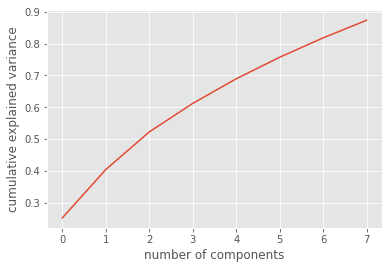

In [86]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [87]:
dataframe.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
0,MTB_anc,1977,.,G,A,19963.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.720;DP=54;Ex...,GT:AD:DP:GQ:PL,"0/1:34,20:54:99:571,0,1117",1.0,0.5,2.0,0.72,54.0,0.0442,1.003,0.5558,60.0,0.0,30.57,0.655,0.434,0/1,"34,20",99.0,"571,0,1117",NaN,NaN,NaN,2,34.0,20.0,0,1,54.0,0.629630,0.370370,False,1977.0,555.0,1,1
2,MTB_anc,6140,.,G,T,22403.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.43;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:28,46:74:99:1388,0,597",1.0,0.5,2.0,1.43,74.0,0.0069,0.919,0.7203,60.0,0.0,29.67,-0.273,0.827,0/1,"28,46",99.0,"1388,0,597",NaN,NaN,NaN,2,28.0,46.0,0,1,74.0,0.378378,0.621622,False,3608.0,1445.0,1,2
3,MTB_anc,7585,.,C,G,31938.04,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.27;DP=79;Exc...,GT:AD:DP:GQ:PL,"0/1:47,32:79:99:920,0,1429",1.0,0.5,2.0,1.27,79.0,0.0111,0.994,0.6656,60.0,0.0,32.33,-0.405,0.573,0/1,"47,32",99.0,"920,0,1429",NaN,NaN,NaN,2,47.0,32.0,0,1,79.0,0.594937,0.405063,False,1445.0,1558.0,1,1
5,MTB_anc,9304,.,A,G,33683.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.59;DP=77;Exc...,GT:AD:DP:GQ:PL,"0/1:35,42:77:99:1307,0,908",1.0,0.5,2.0,1.59,77.0,0.0021,2.716,0.7750,60.0,0.0,33.15,-0.480,0.412,0/1,"35,42",99.0,"1307,0,908",NaN,NaN,NaN,2,35.0,42.0,0,1,77.0,0.454545,0.545455,False,161.0,1437.0,1,1
6,MTB_anc,10741,.,C,G,25056.54,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.52;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:42,32:74:99:853,0,1395",1.0,0.5,2.0,1.52,74.0,0.0442,4.721,0.5564,60.0,0.0,30.67,-0.615,1.392,0/1,"42,32",99.0,"853,0,1395",NaN,NaN,NaN,2,42.0,32.0,0,1,74.0,0.567568,0.432432,False,1437.0,2719.0,1,1


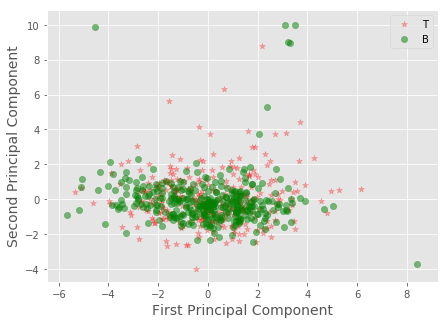

In [88]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=(dataframe['category'].values -1)
cdict={0:'red',1:'green'}
labl={0:'T',1:'B'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [89]:
pca.components_.shape

(8, 15)

In [90]:
# Dump components relations with features:
corr_PCA_col = pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])
corr_PCA_col

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,-0.047078,-0.007157,-0.331710,0.038587,-0.497742,-0.497758,-0.077715,-0.077704,0.178544,-0.102669,0.016048,-0.021019,-0.380742,-0.436166,0.017360
2,-0.425502,-0.298842,-0.250906,0.266429,0.138010,0.137989,-0.377956,-0.264411,0.350615,0.058983,0.053087,0.271109,0.353862,-0.126812,-0.028698
3,0.248902,-0.523920,-0.313934,-0.070194,0.036872,0.036733,0.249877,0.357657,0.160656,-0.081508,-0.415646,0.350702,-0.103568,0.163794,-0.035294
4,0.484275,-0.041157,-0.032420,0.084516,0.042035,0.042009,-0.400620,-0.509239,0.110393,-0.081501,-0.181341,-0.155241,-0.243672,0.312056,-0.315705
5,0.315390,0.151768,0.073275,0.194662,0.019397,0.019382,-0.204268,0.146271,0.208011,-0.240465,0.444923,0.400809,-0.146201,0.177683,0.507660
6,-0.123844,-0.014550,0.007179,-0.524728,0.064831,0.064716,-0.040815,-0.129988,0.126826,-0.769725,-0.087635,-0.138843,0.161130,-0.054483,0.132875
7,-0.036007,0.287460,0.206733,-0.299156,-0.046061,-0.045991,-0.199594,0.245654,0.134805,-0.018200,0.094588,0.487435,-0.014458,-0.061092,-0.640649
8,-0.021302,-0.027522,-0.030463,0.628421,0.018913,0.019174,0.234625,0.130731,-0.174844,-0.544728,0.171442,-0.088533,0.054834,-0.023705,-0.402474


In [91]:
# Get a series containing maximum value of each column
#maxValuesObj = corr_PCA_col.max()
#print('Maximum value in each column : ')
#print(maxValuesObj)

In [92]:
#corr_PCA_col.append(maxValuesObj, ignore_index=True)

# PCA 2: using covariances

In [93]:
cov_df = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]]

covarianceMatrix = pd.DataFrame(data = np.cov(cov_df, rowvar = False), columns = cov_df.columns, index = cov_df.columns)

In [94]:
covarianceMatrix

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
AF,0.009112,0.019223,9.461027e+01,-0.003324,0.006021,0.005896,0.026161,0.010286,-0.074161,-0.024598,-0.025090,-0.003223,-0.541604,0.547626,-0.001487
QD,0.019223,9.016998,1.136212e+04,-0.073768,-5.714213,-5.705673,-0.021747,-0.045947,-3.147937,0.069916,1.624365,-0.411653,-4.063703,-1.650510,0.103624
QUAL,94.610270,11362.124704,5.434315e+07,-286.744959,60978.853360,61019.483856,1228.676476,661.739022,-15211.144644,1999.716579,1291.466994,-572.489798,24137.112943,36841.740417,44.396527
SOR,-0.003324,-0.073768,-2.867450e+02,0.074177,-0.023774,-0.022681,-0.077244,-0.028705,0.174477,0.055638,0.057406,0.013007,0.181799,-0.205573,0.001825
dp,0.006021,-5.714213,6.097885e+04,-0.023774,293.869271,293.918528,1.039921,0.606332,-15.139822,6.572270,-0.891286,0.803951,146.695248,147.174023,-0.516296
DP,0.005896,-5.705673,6.101948e+04,-0.022681,293.918528,293.977208,1.041246,0.606470,-15.144799,6.573084,-0.889948,0.803530,146.725199,147.193328,-0.518212
MQ,0.026161,-0.021747,1.228676e+03,-0.077244,1.039921,1.041246,2.276039,0.573392,-2.153001,0.019117,-0.408008,-0.131918,-1.011120,2.051041,0.074541
MQRankSum,0.010286,-0.045947,6.617390e+02,-0.028705,0.606332,0.606470,0.573392,0.503267,-0.537410,-0.002828,-0.112854,0.085347,-0.279288,0.885620,0.062951
FS,-0.074161,-3.147937,-1.521114e+04,0.174477,-15.139822,-15.144799,-2.153001,-0.537410,24.109766,-1.180472,-0.147185,0.603762,-2.619458,-12.520364,0.072264
GQ,-0.024598,0.069916,1.999717e+03,0.055638,6.572270,6.573084,0.019117,-0.002828,-1.180472,6.954907,0.024635,0.009120,3.535845,3.036424,-0.117987


In [95]:
eigenvalues, eigenvectors = np.linalg.eig(covarianceMatrix)

In [96]:
eigenvalues

array([ 5.43433294e+07,  5.65762736e+02,  6.98639087e+01,  1.96530719e+01,
        6.76099138e+00,  5.74358751e+00,  3.00801784e+00,  2.10686440e+00,
        9.40778160e-01,  3.89619830e-01,  1.25091155e-01,  6.76932834e-02,
        5.61465097e-03,  7.13059480e-04, -3.02170990e-15])

In [97]:
eigenvectors.shape

(15, 15)

In [107]:
totalSum = sum(eigenvalues)
variablesExplained = [((i / totalSum)) for i in sorted(eigenvalues, reverse = True)]

In [105]:
variablesExplained

[0.9999875896393132,
 1.0410766540390697e-05,
 1.2855863359822839e-06,
 3.616419569203949e-07,
 1.244109912301591e-07,
 1.0568944342721882e-07,
 5.5351421080232e-08,
 3.8769031528965e-08,
 1.731153566611004e-08,
 7.169509101781069e-09,
 2.3018391419074837e-09,
 1.2456440203952018e-09,
 1.033168441820197e-10,
 1.312121724215326e-11,
 -5.560337281805217e-23]

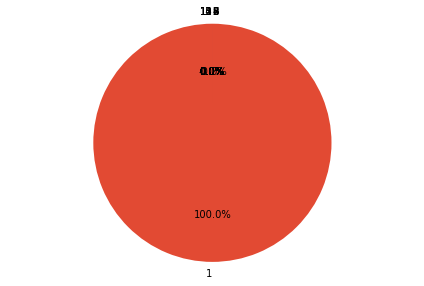

In [106]:
# Pie chart
labels = list(range(1,len(variablesExplained)+1))
labels = [str(i) for i in labels]

sizes = variablesExplained
#colors
#colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
 
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',startangle=90)
# Equal aspect ratio ensures that pie is drawn as a circle
ax1.axis('equal')  
plt.tight_layout()
plt.show()

# Feature Selection

https://towardsdatascience.com/feature-selection-techniques-in-machine-learning-with-python-f24e7da3f36e

## 1. Univariate Selection AF 50:50

In [125]:
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y = Ktest5['category']    #target column i.e price range

In [126]:
X.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD
0,0.370370,30.57,19963.51,0.434,54.0,54.0,60.0,1.003,99.0,0.0442,34.0,20.0
2,0.621622,29.67,22403.11,0.827,74.0,74.0,60.0,0.919,99.0,0.0069,28.0,46.0
3,0.405063,32.33,31938.04,0.573,79.0,79.0,60.0,0.994,99.0,0.0111,47.0,32.0
5,0.545455,33.15,33683.24,0.412,77.0,77.0,60.0,2.716,99.0,0.0021,35.0,42.0
6,0.432432,30.67,25056.54,1.392,74.0,74.0,60.0,4.721,99.0,0.0442,42.0,32.0


In [127]:
X[X.values < 0]

,AF,QD,QUAL,SOR,dp,DP,MQ,FS,GQ,ExcessHet,REF_AD,ALT_AD


In [130]:
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=12)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  27636.593915
7          FS    154.501891
11     ALT_AD      8.252040
9   ExcessHet      6.437506
1          QD      6.165875
10     REF_AD      5.598893
4          dp      0.132172
5          DP      0.124151
6          MQ      0.113151
0          AF      0.069975
8          GQ      0.026829
3         SOR      0.011096


## 1. Univariate Selection AF 80:20

In [135]:
X8 = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD"]]  #independent columns
# "BaseQRankSum" ,"MQRankSum" and "ReadPosRankSum" removed because they are negative
y8 = Ktest8['category']    #target column i.e price range

In [136]:
#apply SelectKBest class to extract top 10 best features
bestfeatures8 = SelectKBest(score_func=chi2, k=12)
fit8 = bestfeatures.fit(X8,y8)
dfscores8 = pd.DataFrame(fit8.scores_)
dfcolumns8 = pd.DataFrame(X8.columns)
#concat two dataframes for better visualization 
featureScores8 = pd.concat([dfcolumns8,dfscores8],axis=1)
featureScores8.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores8.nlargest(12,'Score'))  #print 10 best features

        Specs         Score
2        QUAL  30602.528706
11     ALT_AD   6815.896437
10     REF_AD   6430.637902
7          FS    156.395769
0          AF    105.429590
1          QD      7.556652
9   ExcessHet      5.864818
5          DP      0.107224
4          dp      0.096516
8          GQ      0.059255
6          MQ      0.035979
3         SOR      0.031769


# 2. Feature Importance

In [78]:
Ktest5.columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category'],
      dtype='object')

In [98]:
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest5['category']    #target column i.e price range

[0.04425339 0.11997471 0.2236494  0.05277372 0.03352404 0.04211539
 0.00924037 0.07837442 0.00131572 0.07740201 0.04134956 0.03546503
 0.07798    0.00217692 0.04219489 0.11821042]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


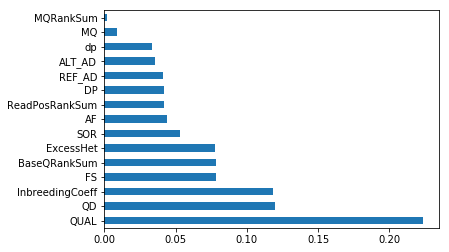

In [99]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

In [100]:
X = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum", "InbreedingCoeff"]]  #independent columns
y = Ktest8['category']    #target column i.e price range

[7.10152803e-01 2.40284480e-04 3.09656045e-02 2.36931363e-03
 4.64250645e-03 3.01848109e-03 0.00000000e+00 2.63339120e-03
 1.10654107e-03 3.48996907e-03 2.68675246e-02 1.86728530e-01
 6.39139857e-03 8.79629630e-04 3.64382567e-04 2.01496401e-02]


/home/laura/env36/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


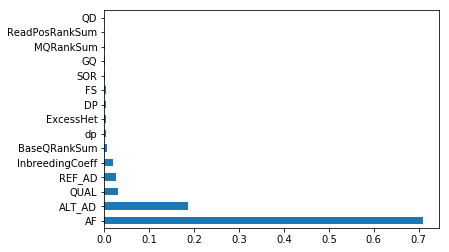

In [101]:
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

# 3.Correlation Matrix with Heatmap

In [87]:
data = Ktest5[['POS', 'QUAL', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'REF_AD',
       'ALT_AD', 'dp', 'aF', 'AF',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category']]
X = Ktest5[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y = Ktest5['category']    #target column i.e price range

In [88]:
data.columns

Index(['POS', 'QUAL', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'REF_AD', 'ALT_AD', 'dp',
       'aF', 'AF', 'snp_left_distance', 'snp_right_distance', 'Window_10',
       'category'],
      dtype='object')

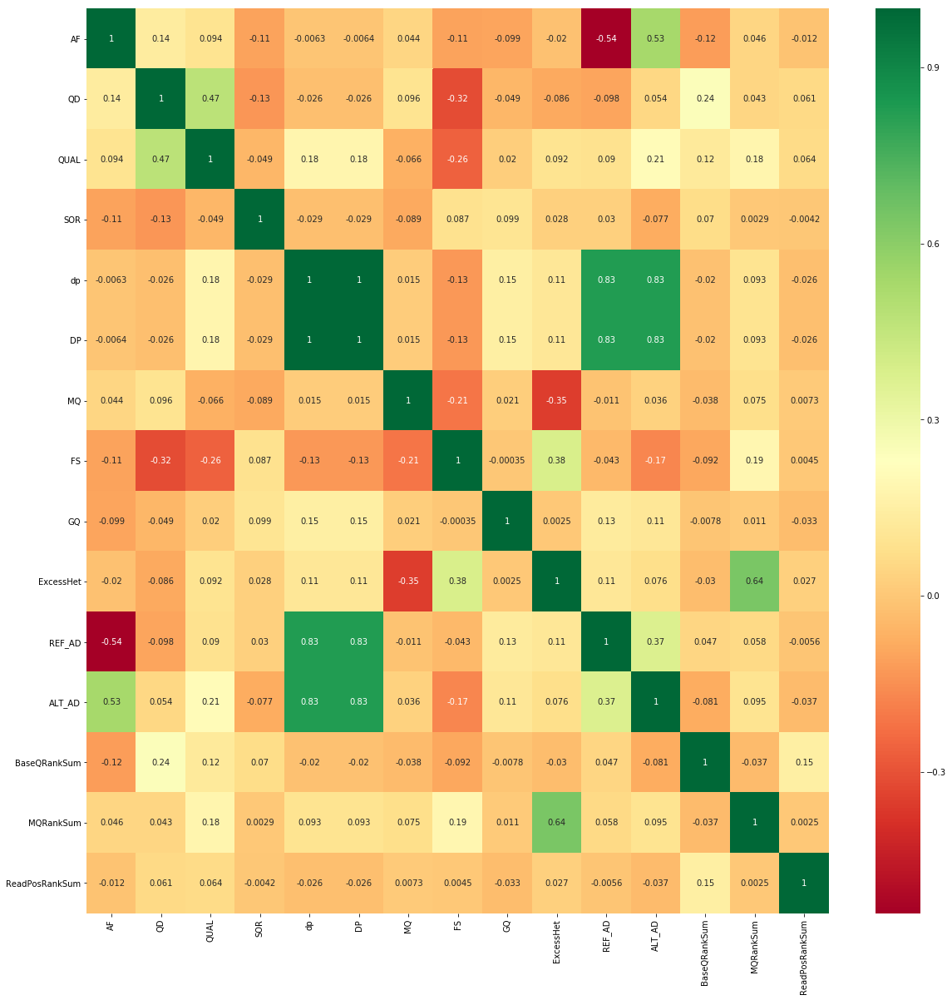

In [89]:
#get correlations of each features in dataset
corrmat = X.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(X[top_corr_features].corr(),annot=True,cmap="RdYlGn")

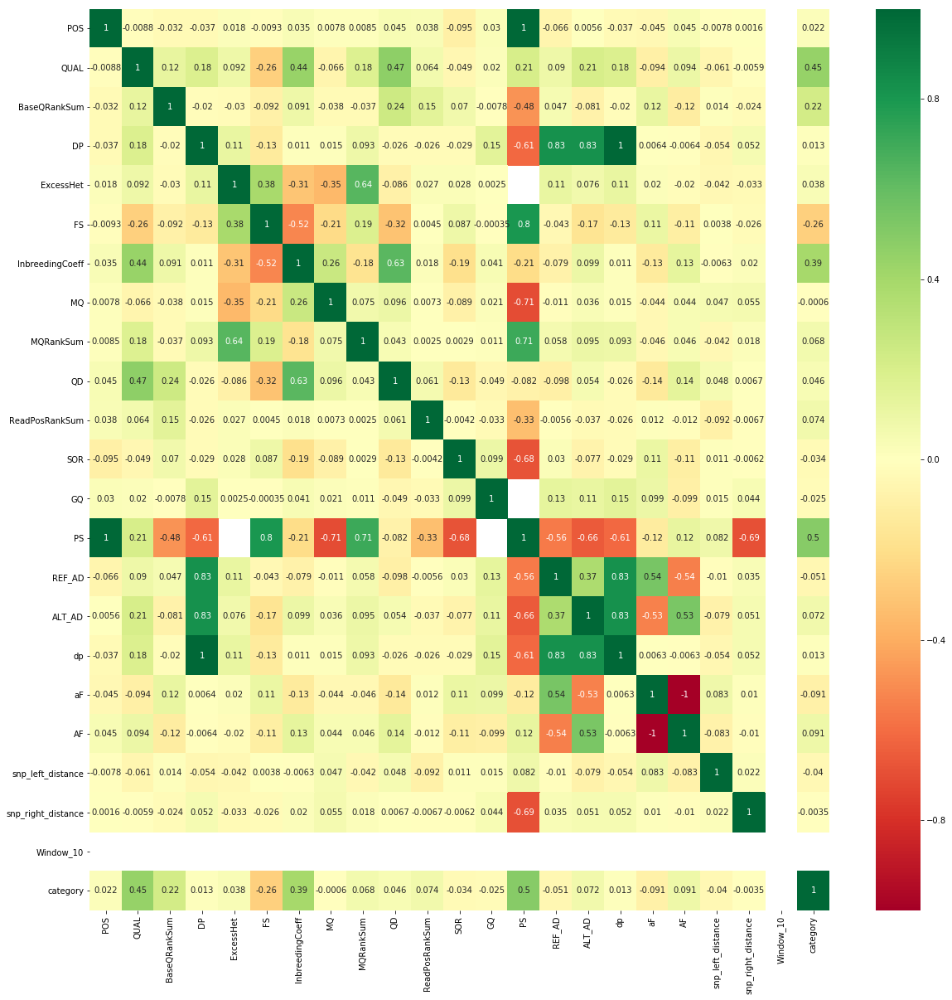

In [90]:
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [83]:
data8 = Ktest8[['POS', 'QUAL', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'InbreedingCoeff', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'REF_AD',
       'ALT_AD', 'dp', 'aF', 'AF',
       'snp_left_distance', 'snp_right_distance', 'Window_10', 'category']]
X8 = Ktest8[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ", "FS","GQ", "ExcessHet","REF_AD", "ALT_AD", "BaseQRankSum", "MQRankSum", "ReadPosRankSum"]]  #independent columns
y8 = Ktest8['category']    #target column i.e price range

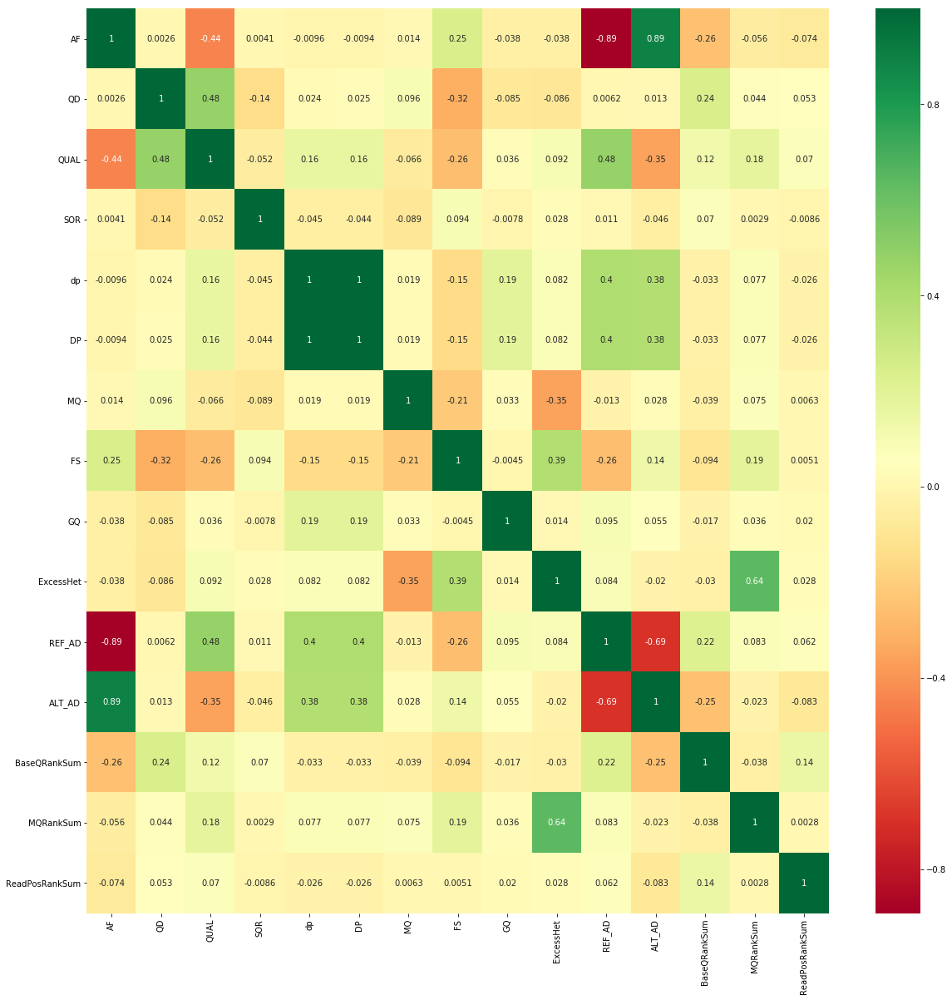

In [85]:
#get correlations of each features in dataset
corrmat = X8.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(X8[top_corr_features].corr(),annot=True,cmap="RdYlGn")

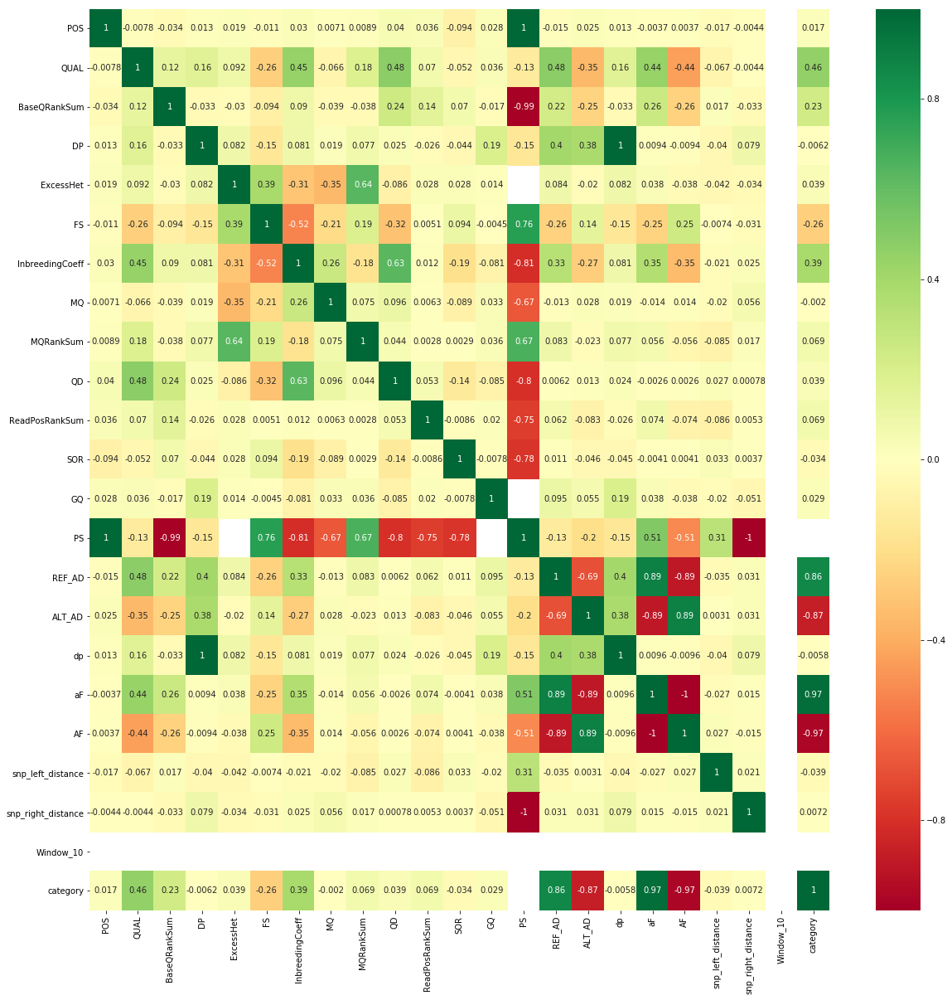

In [86]:
#get correlations of each features in dataset
corrmat = data8.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(data8[top_corr_features].corr(),annot=True,cmap="RdYlGn")